In [1]:
import pandas as pd
import numpy as np
import nibabel as nib
from pathlib import Path
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib as mpl

(np.float64(-0.5), np.float64(255.5), np.float64(0.5), np.float64(-0.5))

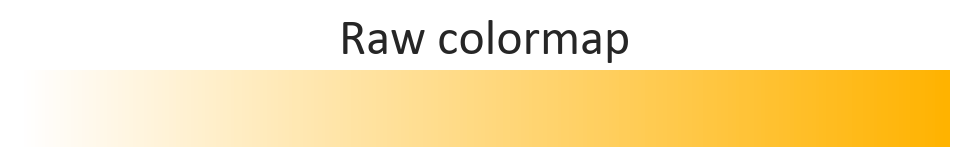

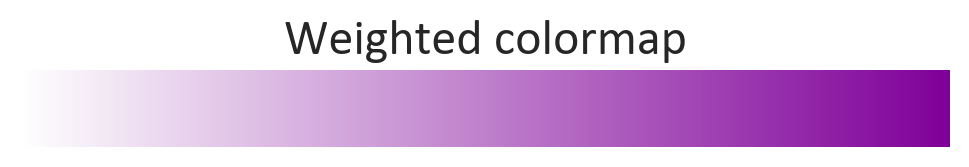

In [2]:
# ── Global visualisation configuration ──────────────────────────────────────

# 1.  General Matplotlib defaults
# ── Global visualisation configuration ──────────────────────────────────────
import matplotlib as mpl
import seaborn as sns

# Add font family to the rcParams (from tff file)
from matplotlib import font_manager

font_path = "/home/galkepler/.fonts/calibri-regular.ttf"
font_manager.fontManager.addfont(font_path)


mpl.rcParams.update(
    {
        # ── Canvas size & resolution ───────────────────────────────────────────
        # Default figure size: 12×8 inches  →  4800×3200 px when exported at 400 dpi
        "figure.figsize": (12, 8),
        "figure.dpi": 200,  # crisp in-notebook / retina preview
        "savefig.dpi": 400,  # print-quality PNG/PDF
        # ── Fonts ──────────────────────────────────────────────────────────────
        "font.family": "Calibri",
        # "font.sans-serif": ["Roboto", "DejaVu Sans", "Arial"],
        "font.sans-serif": ["Calibri", "DejaVu Sans", "Arial"],
        "axes.titlesize": 24,
        # "axes.titleweight": "bold",
        "axes.labelsize": 24,
        "xtick.labelsize": 14,
        "ytick.labelsize": 14,
        "legend.fontsize": 20,
        # ── Axis & spine aesthetics ────────────────────────────────────────────
        "axes.spines.top": False,
        "axes.spines.right": False,
        "axes.spines.left": True,
        "axes.spines.bottom": True,
        "axes.linewidth": 1,
        "axes.grid": True,
        "grid.color": "#E6E6E6",
        "grid.linewidth": 0.4,
        "grid.alpha": 0.8,
        # ── Colour cycle (colour-blind-safe) ───────────────────────────────────
        "axes.prop_cycle": mpl.cycler(color=sns.color_palette("Set2")),
        # ── Figure background ─────────────────────────────────────────────────
        "figure.facecolor": "white",
    }
)

# Seaborn theme inherits the rcParams above
sns.set_theme(context="talk", style="whitegrid", palette="Set2")


# 2.  Seaborn theme (inherits Matplotlib rcParams)
sns.set_theme(
    context="talk",  # slightly larger fonts for presentations / papers
    style="whitegrid",  # grid only on y-axis (good for histograms)
    palette="Set2",  # matches the rcParams colour cycle
)


# 3.  Helper function for consistent figure export
def savefig_nice(fig, filename, *, tight=True, transparent=True, dpi=300, **savefig_kwargs):
    """Save figure with tight layout and correct DPI."""
    if tight:
        fig.tight_layout()
    fig.savefig(filename, dpi=dpi, bbox_inches="tight", transparent=transparent, **savefig_kwargs)

mpl.rcParams["font.family"] = "Calibri"  # or any other font you want

# 4.  Colour constants for this project (optional convenience)
# COL_RAW = "#1f77b4"  # e.g. unweighted sample
COL_RAW = "#ffb300"
# COL_WEIGHTED = "#d62728"  # weighted sample
COL_WEIGHTED = "#7F0099CE"  # weighted sample
COL_REF = "0.25"  # census reference (neutral grey)
COL_CENSUS = "#A5A5A5"

# generate colormaps from white to colour
COL_WHITE = "white"
COL_RAW_RGB = mpl.colors.to_rgb(COL_RAW)
COL_WEIGHTED_RGB = mpl.colors.to_rgb(COL_WEIGHTED)
CMAP_RAW = mpl.colors.LinearSegmentedColormap.from_list("raw", [COL_WHITE, COL_RAW_RGB], N=256)
CMAP_WEIGHTED = mpl.colors.LinearSegmentedColormap.from_list(
    "weighted", [COL_WHITE, COL_WEIGHTED_RGB], N=256
)
# visualize the colormaps
# if __name__ == "__main__":
fig, ax = plt.subplots(figsize=(6, 0.5))
ax.imshow(np.linspace(0, 1, 256)[None, :], aspect="auto", cmap=CMAP_RAW)
ax.set_title("Raw colormap")
ax.axis("off")
# savefig_nice(fig, "colormap_raw.png")

fig, ax = plt.subplots(figsize=(6, 0.5))
ax.imshow(np.linspace(0, 1, 256)[None, :], aspect="auto", cmap=CMAP_WEIGHTED)
ax.set_title("Weighted colormap")
ax.axis("off")
# savefig_nice(fig, "colormap_weighted.png")

In [3]:
ATLAS = "schaefer2018tian2020_400_7"
region_col = "index"
# Load important files
DATA_DIR = Path("/media/storage/phd/neuroaging/data")
# DATA_DIR = Path("/media/groot/Minerva/phd/neuroaging/data")

# Output directory for figures
OUTPUT_DIR = Path("/media/storage/phd/neuroaging/figures/revision/fig4")
# OUTPUT_DIR = Path("/media/groot/Minerva/phd/neuroaging/figures/revision/fig2_clustering")
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

# Load the data
parcels = pd.read_csv(DATA_DIR / "external" / "atlases" / ATLAS / "parcels.csv", index_col=0)
nifti = DATA_DIR / "external" / "atlases" / ATLAS / "atlas.nii.gz"
nifti_matlab = DATA_DIR / "external" / "atlases" / ATLAS / "atlas_matlab.nii"

In [4]:
metrics = ["gm_vol", "wm_vol", "csf_vol", "adc", "fa", "ad", "rd"]
distribution_metric = "qfmean"

bad_subjects = ["IN120120"]

# Load the data
data = {}
for metric in metrics:
    data[metric] = pd.read_csv(DATA_DIR / "processed" / f"{metric}.csv", index_col=0).reset_index(
        drop=True
    )
    # drop problematic subjects
    data[metric] = data[metric][~data[metric]["subject_code"].isin(bad_subjects)]
    data[metric]["sex"] = data[metric]["sex"].map({"M": 0, "F": 1})


# data["age_squared"] = data["age_at_scan"] ** 2

/tmp/ipykernel_1050732/841459950.py:9: DtypeWarning: Columns (1,7,61,67,71,72,73,74,75,77,78,79,80,85,86,87,88,89,90,92,106,108,109,114,115,116,117,118,125,126,127) have mixed types. Specify dtype option on import or set low_memory=False.
  data[metric] = pd.read_csv(DATA_DIR / "processed" / f"{metric}.csv", index_col=0).reset_index(
/tmp/ipykernel_1050732/841459950.py:9: DtypeWarning: Columns (1,7,61,67,71,72,73,74,75,77,78,79,80,85,86,87,88,89,90,92,106,108,109,114,115,116,117,118,125,126,127) have mixed types. Specify dtype option on import or set low_memory=False.
  data[metric] = pd.read_csv(DATA_DIR / "processed" / f"{metric}.csv", index_col=0).reset_index(
/tmp/ipykernel_1050732/841459950.py:9: DtypeWarning: Columns (1,7,61,67,71,72,73,74,75,77,78,79,80,85,86,87,88,89,90,92,106,108,109,114,115,116,117,118,125,126,127) have mixed types. Specify dtype option on import or set low_memory=False.
  data[metric] = pd.read_csv(DATA_DIR / "processed" / f"{metric}.csv", index_col=0).reset

In [5]:
metric_cols = {metric: "volume" if "vol" in metric else distribution_metric for metric in metrics}

for m, df in data.items():
    df = df.rename(columns={metric_cols[m]: "value"})
    data[m] = df

In [6]:
israel_population = pd.read_csv(DATA_DIR / "processed" / "israel_population.csv")

In [7]:
import numpy as np
import pandas as pd


# ─────────────────────────────────────────────────────────────────────────────
def compute_poststrat_weights(
    sample_df: pd.DataFrame,
    pop_df: pd.DataFrame,
    *,
    age_col: str = "age_at_scan",
    start_col: str = "range_start",
    end_col: str = "range_end",
    pop_total_col: str = "total",
    cap: float | None = None,
    return_bin_table: bool = False,
):
    """
    Post-stratification weights so that the age distribution of *sample_df*
    matches an external population distribution supplied in *pop_df*.

    Parameters
    ----------
    sample_df : DataFrame with an ``age_col`` column (years; int or float).
    pop_df    : DataFrame with columns
                    [start_col, end_col, pop_total_col].
                * Values in ``pop_total_col`` can be counts **or** percentages
                  (they are internally re-scaled to proportions).
                * The row order doesn’t matter; they will be sorted.
    cap       : Optional float.  If provided, weights are truncated at
                ``cap × mean(weight)`` and then re-scaled so mean(weight)=1.
    return_bin_table : If True, also return a DataFrame summarising
                       n_sample, n_pop, and weight_factor for every bin.

    Returns
    -------
    weights   : 1-D numpy array aligned with ``sample_df.index``.
    bin_table : (optional) tidy per-bin summary (see above).
    """

    # 1 ── tidy & validate the population table --------------------------------
    pop = (
        pop_df[[start_col, end_col, pop_total_col]]
        .dropna()
        .astype({start_col: int, end_col: int, pop_total_col: float})
        .sort_values(start_col)  # your CSV is descending; fix that
        .reset_index(drop=True)
    )

    if (pop[end_col] <= pop[start_col]).any():
        raise ValueError("Each range_end must exceed range_start.")

    if (pop[start_col].iloc[1:].values < pop[end_col].iloc[:-1].values).any():
        overlap = pop.iloc[
            np.where(pop[start_col].iloc[1:].values < pop[end_col].iloc[:-1].values)[0] + 1
        ][[start_col, end_col]]
        raise ValueError(
            "Age bins overlap (rows shown below) — "
            "merge / correct them before weighting:\n"
            f"{overlap}"
        )

    # 2 ── build right-inclusive bin edges  (···| s_i  …  e_i | s_{i+1} …) ----
    edges = pop[start_col].tolist() + [pop[end_col].iloc[-1]]

    # 3 ── assign every participant to a bin -----------------------------------
    s_bins = pd.cut(
        sample_df[age_col],
        bins=edges,
        right=True,
        include_lowest=True,
        labels=pop.index,  # categorical labels 0,1,…
    )

    # 4 ── compute *sample* and *population* proportions per bin --------------
    n_sample = s_bins.value_counts(sort=False).sort_index()
    prop_sample = n_sample / n_sample.sum()

    prop_pop = pop[pop_total_col] / pop[pop_total_col].sum()

    # 5 ── weight factor = pop_prop / sample_prop ------------------------------
    weight_factor = prop_pop / prop_sample.replace(0, np.nan)  # avoid /0 → NaN

    # 6 ── map factor back to each row ----------------------------------------
    w = s_bins.map(weight_factor).astype(float).to_numpy()
    w = np.where(np.isnan(w), 0.0, w)  # rows that fell outside bins → 0

    # 7 ── optional weight truncation (winsorisation) --------------------------
    if cap is not None and cap > 0:
        mean_pos = w[w > 0].mean()
        w = np.clip(w, 0, cap * mean_pos)

    # 8 ── re-scale so mean(weight > 0) == 1 -----------------------------------
    positive = w > 0
    w[positive] = w[positive] / w[positive].mean()

    # 9 ── return --------------------------------------------------------------
    if return_bin_table:
        bin_tbl = pd.DataFrame(
            {
                "n_sample": n_sample,
                "n_pop": prop_pop * n_sample.sum(),  # rescaled to sample size
                "prop_sample": prop_sample,
                "prop_pop": prop_pop,
                "weight_factor": weight_factor,
            }
        )
        return w, bin_tbl

    return w

In [8]:
import numpy as np
import pandas as pd

def compute_joint_poststrat_weights(
    sample_df: pd.DataFrame,
    pop_df: pd.DataFrame,
    *,
    age_col: str = "age_at_scan",
    sex_col: str = "sex",
    male_label = 0,
    female_label = 1,
    start_col: str = "range_start",
    end_col: str = "range_end",
    cap: float | None = None,
    return_bin_table: bool = False,
):
    """
    Computes joint post-stratification weights for Age and Sex so the sample
    matches an external census distribution.
    
    Parameters
    ----------
    sample_df : DataFrame with age and sex columns.
    pop_df    : DataFrame with [range_start, range_end, male, female].
    male_label/female_label : The values used in sample_df['sex'] (e.g., 0 and 1).
    cap       : Optional multiplier to truncate extreme weights.
    """
    # 1. Validation: Ensure all columns exist
    required_sample = [age_col, sex_col]
    required_pop = [start_col, end_col, "male", "female"]
    
    for col in required_sample:
        if col not in sample_df.columns:
            raise KeyError(f"Column '{col}' not found in sample_df. Available: {list(sample_df.columns)}")
    for col in required_pop:
        if col not in pop_df.columns:
            raise KeyError(f"Column '{col}' not found in pop_df. Available: {list(pop_df.columns)}")

    # 2. Tidy population table and convert to Long Format
    pop = pop_df.sort_values(start_col).copy()
    pop_long = pop.melt(
        id_vars=[start_col, end_col],
        value_vars=['male', 'female'],
        var_name='sex_str',
        value_name='pop_val'
    )
    
    # Map 'male'/'female' strings to the labels in your sample (0 and 1)
    pop_long[sex_col] = pop_long['sex_str'].map({'male': male_label, 'female': female_label})
    pop_long['prop_pop'] = pop_long['pop_val'] / pop_long['pop_val'].sum()
    
    # 3. Create Age Bins
    # edges define brackets: [0, 5, 10, ..., 90, 1000001]
    edges = sorted(list(pop[start_col].unique()) + [int(pop[end_col].max()) + 1])
    bin_labels = sorted(list(pop[start_col].unique()))
    
    sample = sample_df.copy()
    sample['age_bin_start'] = pd.cut(
        sample[age_col], 
        bins=edges, 
        labels=bin_labels, 
        right=False # standard for age: [start, end)
    )
    
    if sample['age_bin_start'].isna().any():
        print("Warning: Some participants fall outside the census age ranges.")

    # 4. Calculate Sample Proportions per (Age, Sex) cell
    sample_counts = sample.groupby(['age_bin_start', sex_col], observed=False).size().reset_index(name='n_sample')
    sample_counts['prop_sample'] = sample_counts['n_sample'] / sample_counts['n_sample'].sum()
    
    # Ensure types match for merging
    sample_counts['age_bin_start'] = sample_counts['age_bin_start'].astype(pop_long[start_col].dtype)
    
    # 5. Calculate Weight Factors (Population Proportion / Sample Proportion)
    weights_lookup = pd.merge(
        pop_long[[start_col, sex_col, 'prop_pop']],
        sample_counts,
        left_on=[start_col, sex_col],
        right_on=['age_bin_start', sex_col],
        how='left'
    )
    weights_lookup['weight_factor'] = weights_lookup['prop_pop'] / weights_lookup['prop_sample'].replace(0, np.nan)
    
    # 6. Map Weights back to individual sample rows
    sample['age_bin_start'] = sample['age_bin_start'].astype(pop_long[start_col].dtype)
    sample_with_weights = pd.merge(
        sample,
        weights_lookup[[start_col, sex_col, 'weight_factor']],
        left_on=['age_bin_start', sex_col],
        right_on=[start_col, sex_col],
        how='left'
    )
    
    w = sample_with_weights['weight_factor'].fillna(0).to_numpy()
    
    # 7. Apply optional cap and Rescale so mean weight = 1
    if cap is not None and cap > 0:
        mean_pos = w[w > 0].mean() if any(w > 0) else 1.0
        w = np.clip(w, 0, cap * mean_pos)
        
    if any(w > 0):
        w = w / w.mean()
    else:
        print("Error: No matches found between sample and census. Weights are all zero.")

    if return_bin_table:
        return w, weights_lookup

    

    return w

In [9]:
# assign weights
for metric in metrics:
    data[metric]["poststrat_weight"], _ = compute_joint_poststrat_weights(
        data[metric],
        israel_population,
        age_col="age_at_scan",
        sex_col="sex",
        return_bin_table=True,
        cap=10  # Optional: prevents any single female/male from having too much influence
    )
    data[metric]["subject_code"] = data[metric]["subject_code"].astype(str).str.zfill(4)

In [10]:
# df_long = data["adc"].copy()
# df_long[df_long["subject_code"] == 447]["subject_code"]

In [11]:
import pandas as pd
from functools import reduce


def long_to_wide(
    long_df,
    *,
    index="subject_code",
    columns=region_col,
    values="value",
):
    """Pivot a long metric table → wide DataFrame (subjects × regions)."""
    wide = long_df.pivot_table(index=index, columns=columns, values=values, aggfunc="first")
    # Optional: drop regions with >20 % missing values
    thresh = int(0.8 * len(wide))
    wide = wide.dropna(axis=1, thresh=thresh)
    # Optional: drop subejcts with >20 % missing values
    thresh = int(0.8 * len(parcels))
    wide = wide.dropna(axis=0, thresh=thresh)
    return wide


def prep_metric_matrices(metric_dict, *, index="subject_code"):
    """
    Parameters
    ----------
    metric_dict : {metric_name: long_df}
        Each DataFrame must include `subject_id`, `region`, `value`,
        `age_at_scan`, and any covariates you want.
    Returns
    -------
    X_dict : {metric_name: ndarray}
             Wide feature matrices aligned on the *intersection* of subjects.
    y, w, cov_df : Series / ndarray
             Age, weights, and any extra covariates for the same subjects.
    """
    # 1.  Convert every long → wide
    wide_dict = {m: long_to_wide(df) for m, df in metric_dict.items()}

    # 2.  Intersect subject index across all metrics
    common_subs = reduce(pd.Index.intersection, [w.index for w in wide_dict.values()])

    # 3.  Slice & order every matrix
    for m in wide_dict:
        wide_dict[m] = wide_dict[m].loc[common_subs]

    # 4.  Pull y, w, covariates from *any* of the long dfs (they all duplicate)
    ref_long = next(iter(metric_dict.values()))
    ref_meta = (
        ref_long.drop_duplicates(subset=index)  # one row per subject
        .set_index(index)
        .loc[common_subs]
    )
    y = ref_meta["age_at_scan"]
    w = ref_meta.get("poststrat_weight", pd.Series(1.0, index=common_subs))
    cov = ref_meta[ref_meta.columns.difference(["age_at_scan", "poststrat_weight"])]

    # 5.  Convert features to numpy (sklearn ready)
    X_dict = {m: wide.to_numpy() for m, wide in wide_dict.items()}
    return X_dict, y.to_numpy(), w.to_numpy(), cov

In [12]:
# -------------------------------------------------------
# Build (X, y, w, cov) once, re-use in every metric loop
# -------------------------------------------------------
X_dict, y, w, cov = prep_metric_matrices(data)
# y_mean = y.mean()
# y = y - y_mean  # center the target variable
# Example list of covariates you want to *keep* (z-scored later if needed)
cov_names = {
    m: ["sex"] if "vol" not in m else ["sex", "tiv"] for m in metrics
}  # e.g. ["sex", "tiv"]

In [13]:
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import PolynomialFeatures


def cole_bias_correction(y_train, y_tr_pred, y_te_pred, degree=1):
    """
    The technique proposed by Cole et al. is to use the slope and intercept of a linear regression model of estimated brain age versus chronological age obtained from training results(Cole et al., 2018). Indeed, for each sample under study, the bias-free Brain-age value was achieved by subtracting the intercept from predicted brain age and then divided by the slope of a linear regression model of estimated brain age on chronological age obtained from the training set

    Parameters
    ----------
    y_train : np.ndarray
        True ages for the training set.
    y_tr_pred : np.ndarray
        Predicted ages for the training set.
    y_te_pred : np.ndarray
        Predicted ages for the test set.

    Returns
    -------
    np.ndarray
        Bias-corrected predicted ages for the test set.
    """
    # Fit a linear regression model to the training data
    model = LinearRegression()
    model.fit(y_train.reshape(-1, 1), y_tr_pred)
    a = model.coef_[0]  # slope
    b = model.intercept_  # intercept

    # Apply the correction to the test set predictions
    y_te_corrected = (y_te_pred - b) / a

    return y_te_corrected


def beheshti_bias_correction(y_train, y_tr_pred, y_te_pred, degree=1):
    """
    The technique proposed by Beheshti et al. is to use a linear regression model to fit the difference between predicted and true ages on the training set, and then apply this correction to the test set predictions.

    Parameters
    ----------
    y_train : np.ndarray
        True ages for the training set.
    y_tr_pred : np.ndarray
        Predicted ages for the training set.
    y_te_pred : np.ndarray
        Predicted ages for the test set.

    Returns
    -------
    np.ndarray
        Bias-corrected predicted ages for the test set.
    """
    # Fit a linear regression model to the training data
    poly = PolynomialFeatures(degree=degree, include_bias=True)
    estimator = LinearRegression()
    model = Pipeline([("poly", poly), ("est", estimator)])
    offset = y_tr_pred - y_train
    model.fit(y_train.reshape(-1, 1), offset)

    # Apply the correction to the test set predictions
    y_te_corrected = y_te_pred - model.predict(y_te_pred.reshape(-1, 1))

    return y_te_corrected


def delange_correction(y_train, y_tr_pred, y_te_pred, y_te_true):
    model = LinearRegression().fit(y_train.reshape(-1, 1), y_tr_pred)
    alpha = model.coef_[0]
    beta = model.intercept_
    correction = y_te_true - (alpha * y_te_true + beta)
    y_te_corrected = y_te_pred + correction
    return y_te_corrected


def beheshti_correction(y_train, y_tr_pred, y_te_pred, y_te_true):
    delta = y_tr_pred - y_train
    model = LinearRegression().fit(y_train.reshape(-1, 1), delta)
    alpha = model.coef_[0]
    beta = model.intercept_
    bias = alpha * y_te_true + beta
    y_te_corrected = y_te_pred - bias
    return y_te_corrected

In [14]:
import numpy as np
from joblib import Parallel, delayed
from sklearn.utils import indexable
from sklearn.model_selection import check_cv
from sklearn.base import clone, is_classifier
from sklearn.utils.validation import _num_samples
import scipy.sparse as sp


def _fit_predict_correct(estimator, X, y, train, test, fit_params, method, correction_func):
    est = clone(estimator)
    X_train, X_test = X[train], X[test]
    y_train, y_test = y[train], y[test]

    # Subset fit_params containing sample_weight (and any other sample-aligned params)
    fit_params_fold = {}
    for k, v in fit_params.items():
        if v is not None and hasattr(v, "__len__") and len(v) == len(y):
            # If this param looks like sample_weights, subset by train indices
            fit_params_fold[k] = v[train]
        else:
            fit_params_fold[k] = v

    est.fit(X_train, y_train, **fit_params_fold)
    y_train_pred = getattr(est, method)(X_train)
    y_test_pred = getattr(est, method)(X_test)
    y_test_pred_corr = correction_func(y_train, y_train_pred, y_test_pred, y_test)
    return y_test_pred_corr


def corrected_cross_val_predict(
    estimator,
    X,
    y=None,
    *,
    groups=None,
    cv=None,
    n_jobs=None,
    verbose=0,
    params=None,
    pre_dispatch="2*n_jobs",
    method="predict",
    correction_func=None,
):
    """
    Generate cross-validated, *bias-corrected* predictions for each input data point.

    This function works just like sklearn's cross_val_predict, but applies the supplied correction_func
    after each split's model is fit and before predictions are returned. The correction_func
    must have the signature:
        y_test_corr = correction_func(y_train, y_train_pred, y_test_pred, y_test)
    """

    X, y, groups = indexable(X, y, groups)
    if params is None:
        params = {}

    cv = check_cv(cv, y, classifier=is_classifier(estimator))
    splits = list(cv.split(X, y, groups))

    test_indices = np.concatenate([test for _, test in splits])
    if np.unique(test_indices).size != _num_samples(X):
        raise ValueError(
            "cross_val_predict only works for partition splits (all samples must appear in exactly one test set)"
        )

    fit_params = params if params is not None else {}

    parallel = Parallel(n_jobs=n_jobs, verbose=verbose, pre_dispatch=pre_dispatch)

    predictions = parallel(
        delayed(_fit_predict_correct)(
            estimator, X, y, train, test, fit_params, method, correction_func
        )
        for train, test in splits
    )

    # Reassemble predictions according to test indices (as in sklearn)
    inv_test_indices = np.empty(len(test_indices), dtype=int)
    inv_test_indices[test_indices] = np.arange(len(test_indices))

    if sp.issparse(predictions[0]):
        predictions = sp.vstack(predictions, format=predictions[0].format)
    else:
        predictions = np.concatenate(predictions)

    return predictions[inv_test_indices]

In [15]:
CORRECTION_METHODS = {
    "cole": cole_bias_correction,
    "beheshti": beheshti_bias_correction,
    "delange": beheshti_bias_correction,  # same as Beheshti
}

In [16]:
import numpy as np
from scipy.stats import pearsonr, spearmanr
from sklearn.base import BaseEstimator, RegressorMixin, clone
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures, StandardScaler
from sklearn.pipeline import make_pipeline
from sklearn.metrics import r2_score, mean_absolute_error, get_scorer
from sklearn.utils.validation import check_is_fitted, check_X_y, check_array
from sklearn.model_selection import train_test_split
import warnings


class BiasCorrectedRegressor(RegressorMixin, BaseEstimator):
    """
    A scikit-learn compatible regressor that applies bias correction for brain age prediction,
    using a nested validation approach to train the bias model, inspired by de Lange/Beheshti
    and polynomial methods. Supports linear or polynomial correction on predicted or chronological age.

    Parameters:
    - base_estimator: object, default=LinearRegression()
        A scikit-learn compatible estimator (e.g., Ridge, SVR, RandomForestRegressor).
    - correction_type: str, default='linear'
        Type of bias correction: 'linear' (de Lange/Beheshti-style) or 'polynomial'.
    - degree: int, default=2
        Degree of polynomial for 'polynomial' correction. Ignored if correction_type='linear'.
        Use 1 for linear, 2-3 for nonlinear. Higher degrees may overfit with small datasets.
    - age_variable: str, default='predicted'
        Variable for bias modeling: 'predicted' (predicted age) or 'chronological' (true age).
        'Chronological' is more standard per literature for age-level corrections.
    - scorer: str or callable, default='r2'
        Scoring function for the score method (e.g., 'r2', 'neg_mean_absolute_error').
    - apply_correction: bool, default=True
        If True, apply bias correction. If False, return raw predictions.
    - val_size: float, default=0.2
        Proportion of training data for validation in nested CV.

    Attributes:
    - base_estimator_: object
        Fitted base estimator.
    - bias_model_: object
        Fitted bias correction model (LinearRegression or Pipeline).
    - age_scaler_: StandardScaler
        Scaler for normalizing ages (if polynomial correction).
    - y_train_: array
        Training chronological ages.

    Notes:
    - Uses nested validation to train the bias model, preventing leakage and improving OOF performance.
    - For 'linear' correction, fits BAG = alpha2 * chronological_age + beta2, corrects as pred - (alpha2 * chronological + beta2).
    - For 'polynomial' correction, models BAG as a polynomial of predicted or chronological age, subtracts the fitted bias.
    - Requires y_chron in predict for correction. If unavailable, returns raw predictions with a warning.
    - For SHAP:
        ```python
        import shap
        model = BiasCorrectedRegressor(base_estimator=Ridge())
        model.fit(X_train, y_train)
        def predict_fixed(X): return model.predict(X, y_chron=y_test)
        explainer = shap.KernelExplainer(predict_fixed, X_train)
        shap_values = explainer(X_test)
        ```
    - For permutation importance:
        ```python
        from sklearn.inspection import permutation_importance
        results = permutation_importance(model, X_test, y_test, scoring='r2')
        ```

    Example:
    ```python
    from sklearn.linear_model import Ridge
    model = BiasCorrectedRegressor(base_estimator=Ridge(alpha=1.0), correction_type='linear')
    model.fit(X_train, y_train)  # X_train: (n_samples, 400) GM volumes
    y_pred = model.predict(X_test, y_chron=y_test)
    print("Metrics:", model.get_metrics(X_test, y_test))
    ```
    """

    def __init__(
        self,
        base_estimator=LinearRegression(),
        correction_type: str = "cole",  # correction_type: 'cole' or 'beheshti' / 'delange' or None
        degree=1,
    ):
        self.base_estimator = base_estimator
        self.correction_type = correction_type
        self.degree = degree

    def fit(self, X, y, sample_weight=None):
        """
        Fit the base estimator and bias correction model using nested validation.

        Parameters:
        - X: array-like of shape (n_samples, n_features)
            Training features (e.g., brain imaging data).
        - y: array-like of shape (n_samples,)
            Chronological ages.
        - sample_weight: array-like of shape (n_samples,), optional
            Sample weights for base estimator.

        Returns:
        - self
        """
        X, y = check_X_y(X, y, accept_sparse=True)
        if sample_weight is not None:
            sample_weight = check_array(sample_weight, ensure_2d=False)

        # Fit the base estimator
        self.base_estimator_ = clone(self.base_estimator)
        self.base_estimator_.fit(X, y, sample_weight=sample_weight)

        self.y_train_ = y.copy()
        self.X_train_ = X.copy()
        return self

    def predict(self, X):
        """
        Predict corrected brain ages.

        Parameters:
        - X: array-like of shape (n_samples, n_features)
            Features for prediction.
        - y_chron: array-like of shape (n_samples,), optional
            Chronological ages for correction. Required if apply_correction=True.

        Returns:
        - array-like of shape (n_samples,)
            Corrected brain age predictions (or raw if apply_correction=False or y_chron=None).
        """
        X = check_array(X, accept_sparse=True)
        check_is_fitted(self, ["base_estimator_"])

        y_te_pred = self.base_estimator_.predict(X)

        if self.correction_type in ["none", None]:
            return y_te_pred

        y_tr_pred = self.base_estimator_.predict(self.X_train_)
        correction_func = CORRECTION_METHODS.get(self.correction_type)
        if correction_func is None:
            raise ValueError(
                f"Unknown correction type '{self.correction_type}'. "
                "Available methods: " + ", ".join(CORRECTION_METHODS.keys())
            )
        return correction_func(
            self.y_train_,
            y_tr_pred,
            y_te_pred,
            degree=self.degree,
        )

    def score(self, X, y):
        """
        Compute the score for corrected predictions.

        Parameters:
        - X: array-like of shape (n_samples, n_features)
            Test features.
        - y: array-like of shape (n_samples,)
            Chronological ages.

        Returns:
        - float
            Score of corrected predictions.
        """
        check_is_fitted(self, ["base_estimator_"])
        y_pred = self.predict(X)
        return self.scorer(y, y_pred)

    def get_metrics(self, X, y):
        """
        Compute metrics including Pearson/Spearman correlations and MAE between BAG and age.

        Parameters:
        - X: array-like of shape (n_samples, n_features)
            Test features.
        - y: array-like of shape (n_samples,)
            Chronological ages.

        Returns:
        - dict
            Metrics including Pearson/Spearman correlations, p-values, and MAE.
        """
        check_is_fitted(self, ["base_estimator_"])
        y_pred = self.predict(X)
        bag = y_pred - y
        pearson_corr, pearson_p = pearsonr(bag, y) if len(y) >= 2 else (np.nan, np.nan)
        spearman_corr, spearman_p = spearmanr(bag, y) if len(y) >= 2 else (np.nan, np.nan)
        mae = mean_absolute_error(y, y_pred)
        return {
            "pearson": {"correlation": pearson_corr, "p_value": pearson_p},
            "spearman": {"correlation": spearman_corr, "p_value": spearman_p},
            "mae": mae,
        }

In [17]:
from sklearn.base import clone
import numpy as np


def manual_cross_val_predict(model, X, y, cv, sample_weight=None):
    """
    Perform manual cross-validation predictions to get out-of-fold (OOF) predictions.

    This clones and fits the model on each train fold, then predicts on the val fold.
    If apply_correction is True, uses y_chron=y_val for corrected predictions.

    Parameters:
    - model: The pipeline or estimator to use (must have fit and predict methods).
    - X: Features (array-like).
    - y: Targets/chronological ages (array-like).
    - cv: Cross-validation splitter (e.g., KFold instance).
    - sample_weight: Optional sample weights (array-like).
    - apply_correction: Bool, if True, apply bias correction (requires y_chron).

    Returns:
    - oof_preds: Array of OOF predictions (same length as y).
    """
    oof_preds = np.zeros(len(y))

    for train_idx, val_idx in cv.split(X):
        pipeline_clone = clone(model)
        X_train, X_val = X[train_idx], X[val_idx]
        y_train, y_val = y[train_idx], y[val_idx]

        fit_params = {}
        if sample_weight is not None:
            w_train = sample_weight[train_idx]
            fit_params["estimator__sample_weight"] = w_train

        pipeline_clone.fit(X_train, y_train, **fit_params)

        oof_preds[val_idx] = pipeline_clone.predict(X_val)
        # if apply_correction:
        # else:
        #     oof_preds[val_idx] = pipeline_clone.predict(X_val)

    return oof_preds

In [18]:
from sklearn.model_selection import KFold


def cross_val_predict_corrected(model, X, y, cv=5, sample_weight=None):
    """
    Compute bias-corrected out-of-fold (OOF) predictions using cross-validation.
    This fits the base estimator and bias correction model within each fold to avoid data leakage.

    Parameters:
    - model: BiasCorrectedRegressor
        The BiasCorrectedRegressor instance (with apply_correction=True).
    - X: array-like of shape (n_samples, n_features)
        Features (e.g., GM volumes).
    - y: array-like of shape (n_samples,)
        Chronological ages.
    - cv: int or cross-validation generator, default=5
        Number of folds or a CV splitter (e.g., KFold(n_splits=5)).
    - sample_weight: array-like of shape (n_samples,), optional
        Sample weights.

    Returns:
    - y_oof_pred: array of shape (n_samples,)
        Bias-corrected OOF predictions.
    """
    if not isinstance(cv, KFold):
        cv = KFold(n_splits=cv)

    y_oof_pred = np.zeros(len(y))

    for train_idx, val_idx in cv.split(X):
        X_train, X_val = X[train_idx], X[val_idx]
        y_train, y_val = y[train_idx], y[val_idx]

        if sample_weight is not None:
            sw_train = sample_weight[train_idx]
            fit_params = {"estimator__sample_weight": sw_train}
        else:
            sw_train = None
            fit_params = {}

        # Clone and fit model on train fold
        fold_model = clone(model)
        fold_model.fit(X_train, y_train, **fit_params)

        # Predict corrected on val fold
        y_val_pred = fold_model.predict(X_val)

        y_oof_pred[val_idx] = y_val_pred

    return y_oof_pred

In [19]:
import numpy as np, pandas as pd
from sklearn.decomposition import PCA
from sklearn.feature_selection import SelectPercentile
from sklearn.linear_model import (
    ElasticNet,
    RidgeCV,
    ElasticNetCV,
    LassoCV,
    Ridge,
    Lasso,
    SGDRegressor,
)

# xgb
from sklearn.ensemble import GradientBoostingRegressor, HistGradientBoostingRegressor
from sklearn.preprocessing import FunctionTransformer, RobustScaler
from sklearn.model_selection import GridSearchCV, KFold, cross_val_predict
from sklearn.metrics import r2_score, mean_absolute_error, root_mean_squared_error
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
import xgboost as xgb

metric = "gm_vol"
X = X_dict[metric]

alphas = np.logspace(-3, 4, 30)  # ridge λ grid

outer_cv = KFold(
    n_splits=10,
    # shuffle=True,
    # random_state=1,
)

ESTIMATORS = {
    "ElasticNet": ElasticNet(max_iter=int(1e6)),
    "Ridge": Ridge(),
    "Lasso": Lasso(max_iter=int(1e6)),
    "HistGB": HistGradientBoostingRegressor(),
    "xgboost": xgb.XGBRegressor(
        n_estimators=1000,
        max_depth=3,
        learning_rate=0.1,
        subsample=0.8,
        colsample_bytree=0.8,
        random_state=42,
    ),
}

PARAM_GRIDS = {
    "ElasticNet": {
        "estimator__l1_ratio": [0.2, 0.5, 0.9, 1.0],  # l1_ratio for ElasticNet
        "estimator__alpha": alphas,  # alpha for ElasticNet
    },
    "Ridge": {
        "estimator__alpha": alphas,  # alpha for Ridge
    },
    "Lasso": {
        "estimator__alpha": alphas,  # alpha for Lasso
    },
    "HistGB": {
        "estimator__max_iter": [100, 200, 300],
        "estimator__max_depth": [3, 5, 7],
        "estimator__learning_rate": [0.01, 0.1, 0.2],
    },
    "xgboost": {
        "estimator__n_estimators": [100, 200, 300],
        "estimator__max_depth": [3, 5, 7],
        "estimator__learning_rate": [0.01, 0.1, 0.2],
        "estimator__subsample": [0.8, 1.0],
        "estimator__colsample_bytree": [0.8, 1.0],
    },
}
# Choose model and define parameter grid(s)
estimator_name = "Ridge"  # Example: using xgboost
estimator = ESTIMATORS[estimator_name]  # xgboost model
param_grid = PARAM_GRIDS[estimator_name]  # xgboost grid

# param_grid.update({
#     "pca__n_components": [0.7, 0.8, 0.9, X.shape[1]],  # PCA components
# })

# pca = PCA(n_components=0.9, random_state=42)  # PCA for dimensionality reduction

scaler = RobustScaler()

# estimator = BiasCorrectedRegressor(
#     base_estimator=base_estimator,
#     # correction_type="beheshti" if apply_correction else "none",  # correction type
#     correction_type="none",
#     degree=1,  # degree of polynomial for correction (1 for linear)
#     # degree=3,
#     # post_hoc_correction=(post_hoc_degree > 0),
#     # correction_method = "linear" if post_hoc_degree == 1 else "none",
#     # use_weights=use_weights,
#     # cv=outer_cv
# )

pipeline = Pipeline(
    [
        ("scaler", scaler),  # StandardScaler for feature scaling
        # ("pca", pca),  # PCA for dimensionality reduction
        ("estimator", estimator),  # Base estimator (e.g., xgboost)
    ]
)

grid = GridSearchCV(
    pipeline,
    param_grid=param_grid,
    cv=3,
    scoring="neg_mean_absolute_error",
    n_jobs=4,
    refit=True,
    verbose=1,
)

In [20]:
weighting_predictions = {}
weighting_rows = []


for [use_weights, key] in [
    (False, "baseline"),
    (True, "weighted"),
]:
    # Optionally concatenate covariates
    covariates = cov_names[metric]
    if cov_names:
        X_model = np.hstack([X, cov[covariates].to_numpy()])
    else:
        X_model = X

    # Fit the model
    grid.fit(X_model, y, estimator__sample_weight=w if use_weights else None)
    model = grid.best_estimator_

    # y_pred = model.predict(X_model, **{"y_chron": y} if apply_correction else {})
    y_pred = cross_val_predict(
        model,
        X_model,
        y,
        cv=outer_cv,
        params={"estimator__sample_weight": w if use_weights else None},
    )

    # y_pred = cross_val_predict_corrected(
    #     model=model,
    #     X=X_model,
    #     y=y,
    #     cv=outer_cv,
    #     sample_weight=w if use_weights else None,
    #     # apply_correction=apply_correction,
    # )
    residuals = y_pred - y
    predictions_df = cov.copy()
    predictions_df["True"] = y
    predictions_df["Predicted"] = y_pred
    # predictions_df["raw_residuals"] = original_residuals
    predictions_df["corrected_residuals"] = residuals
    weighting_predictions[key] = predictions_df
    weighting_rows.append(
        dict(
            key=key,
            model=model,
            # R2=r2_score(y, y_pred, sample_weight=w if use_weights else None),
            # MAE=mean_absolute_error(y, y_pred, sample_weight=w if use_weights else None),
            # RMSE=root_mean_squared_error(y, y_pred, sample_weight=w if use_weights else None),
            R2=r2_score(y, y_pred),
            R2_weighted=r2_score(y, y_pred, sample_weight=w),
            MAE=mean_absolute_error(y, y_pred),
            MAE_weighted=mean_absolute_error(y, y_pred, sample_weight=w),
            RMSE=root_mean_squared_error(y, y_pred),
            RMSE_weighted=root_mean_squared_error(y, y_pred, sample_weight=w),
        )
    )

    # apply correction
    correction_key = "linear_ph" if key == "baseline" else "combined"
    y_pred_corr = corrected_cross_val_predict(
        estimator=model,
        X=X_model,
        y=y,
        cv=outer_cv,
        params={"estimator__sample_weight": w if use_weights else None},
        correction_func=beheshti_correction,
    )
    residuals_corr = y_pred_corr - y
    predictions_df_corr = cov.copy()
    predictions_df_corr["True"] = y
    predictions_df_corr["Predicted"] = y_pred_corr
    predictions_df_corr["corrected_residuals"] = residuals_corr
    weighting_predictions[correction_key] = predictions_df_corr
    weighting_rows.append(
        dict(
            key=correction_key,
            model=model,
            # R2=r2_score(y, y_pred_corr, sample_weight=w if use_weights else None),
            # MAE=mean_absolute_error(y, y_pred_corr, sample_weight=w if use_weights else None),
            # RMSE=root_mean_squared_error(y, y_pred_corr, sample_weight=w if use_weights else None),
            R2=r2_score(y, y_pred_corr),
            R2_weighted=r2_score(y, y_pred_corr, sample_weight=w),
            MAE=mean_absolute_error(y, y_pred_corr),
            MAE_weighted=mean_absolute_error(y, y_pred_corr, sample_weight=w),
            RMSE=root_mean_squared_error(y, y_pred_corr),
            RMSE_weighted=root_mean_squared_error(y, y_pred_corr, sample_weight=w),
        )
    )

Fitting 3 folds for each of 30 candidates, totalling 90 fits


Fitting 3 folds for each of 30 candidates, totalling 90 fits


In [21]:
weighting_df = pd.DataFrame(weighting_rows).set_index("key").sort_values("MAE", ascending=True)
display(weighting_df)

,model,R2,R2_weighted,MAE,MAE_weighted,RMSE,RMSE_weighted
key,,,,,,,
linear_ph,"(RobustScaler(), Ridge(alpha=np.float64(117.21...",0.785540,0.911935,3.813925,4.120435,4.780146,5.157651
baseline,"(RobustScaler(), Ridge(alpha=np.float64(117.21...",0.673557,0.733827,4.575490,6.839106,5.897551,8.966691
combined,"(RobustScaler(), Ridge(alpha=np.float64(117.21...",0.612443,0.856955,5.167913,5.295275,6.425923,6.573339
weighted,"(RobustScaler(), Ridge(alpha=np.float64(117.21...",0.560981,0.818481,5.512596,5.924086,6.839264,7.404755


In [22]:
bag_age_corr = pd.DataFrame(
    index=weighting_df.index,
    columns=["pearson", "spearman"],
    dtype=float,
)
for key in weighting_df.index:
    y_pred = weighting_predictions[key]["Predicted"]
    y_true = weighting_predictions[key]["True"]
    bag_age_corr.loc[key, "pearson"] = np.corrcoef(y_pred - y_true, y_true)[0, 1]
    bag_age_corr.loc[key, "spearman"] = pd.Series(y_pred - y_true).corr(
        pd.Series(y_true), method="spearman"
    )

bag_age_corr.sort_values("pearson", ascending=False)

,pearson,spearman
key,,
combined,-0.087427,-0.065763
linear_ph,-0.095631,-0.047953
weighted,-0.291177,-0.235411
baseline,-0.590044,-0.468011


findfont: Font family ['STIXGeneral'] not found. Falling back to DejaVu Sans.
findfont: Font family ['STIXGeneral'] not found. Falling back to DejaVu Sans.
findfont: Font family ['STIXGeneral'] not found. Falling back to DejaVu Sans.
findfont: Font family ['STIXGeneral'] not found. Falling back to DejaVu Sans.
findfont: Font family ['STIXNonUnicode'] not found. Falling back to DejaVu Sans.
findfont: Font family ['STIXNonUnicode'] not found. Falling back to DejaVu Sans.
findfont: Font family ['STIXNonUnicode'] not found. Falling back to DejaVu Sans.
findfont: Font family ['STIXSizeOneSym'] not found. Falling back to DejaVu Sans.
findfont: Font family ['STIXSizeTwoSym'] not found. Falling back to DejaVu Sans.
findfont: Font family ['STIXSizeThreeSym'] not found. Falling back to DejaVu Sans.
findfont: Font family ['STIXSizeFourSym'] not found. Falling back to DejaVu Sans.
findfont: Font family ['STIXSizeFiveSym'] not found. Falling back to DejaVu Sans.
findfont: Font family ['cmsy10'] not

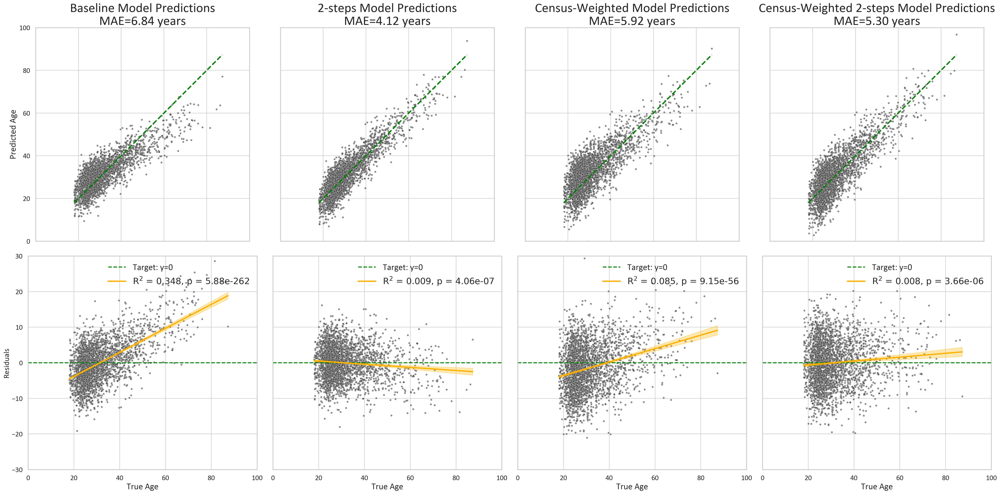

In [23]:
# plot actual vs predicted for all of the models
# plot residuals vs age for all of the models
from statsmodels.formula.api import ols
import statsmodels.api as sm

keys_vis = {
    "baseline": "Baseline Model",
    "weighted": "Census-Weighted Model",
    "linear_ph": "2-steps Model",
    "quadratic_ph": "Quadratic Post-hoc",
    "combined": "Census-Weighted 2-steps Model",
}

title_fontsize = 30
rest_fontsize = 20

nmodels = len(weighting_predictions)
fig, axes = plt.subplots(2, nmodels, figsize=(8 * nmodels, 16), sharey=False, sharex=True)
for i, (key, df) in enumerate(weighting_predictions.items()):
    ax = axes[0, i]
    sns.scatterplot(data=df, x="True", y="Predicted", ax=ax, s=20, color=COL_REF, alpha=0.6)
    ax.set_title(
        f"{keys_vis[key]} Predictions\nMAE={weighting_df.loc[key, 'MAE_weighted']:.2f} years",
        fontsize=title_fontsize,
    )
    ax.set_aspect("equal")
    ax.set_xlabel("")
    ax.plot(
        [df["True"].min(), df["True"].max()],
        [df["True"].min(), df["True"].max()],
        color="green",
        linestyle="--",
        lw=3,
    )
    ax.set_xlim(0, 100)
    ax.set_ylim(0, 100)
    if i == 0:
        ax.set_ylabel("Predicted Age", fontsize=rest_fontsize)
    else:
        ax.set_ylabel("")
        # remove y-axis tick labels
        ax.set_yticklabels([])


for i, (key, df) in enumerate(weighting_predictions.items()):
    ax = axes[1, i]
    if "ph" in key:
        y_col = "corrected_residuals"
    else:
        df["raw_residuals"] = df["True"] - df["Predicted"]
        y_col = "raw_residuals"
    df = df.rename(columns={"True": "age_at_scan"})
    sns.scatterplot(data=df, x="age_at_scan", y=y_col, ax=ax, s=20, color=COL_REF, alpha=0.6)

    # estimate linear and quadratic fit between residuals and age
    lin_m = ols(f"{y_col} ~ age_at_scan", data=df).fit()
    poly_m = ols(f"{y_col} ~ age_at_scan + I(age_at_scan ** 2)", data=df).fit()
    r, p = pearsonr(df["age_at_scan"], df[y_col])
    p_vis = f"{p:.2e}" if p < 0.001 else f"{p:.3f}"
    # draw the "target": y = 0 line
    ax.axhline(0, color="green", linestyle="--", label="Target: y=0")
    # plot the linear fit
    x_vals = np.linspace(df["age_at_scan"].min(), df["age_at_scan"].max(), 300)
    x_frame = pd.DataFrame({"age_at_scan": x_vals})
    # find the p-value for the linear fit
    p_value = lin_m.f_pvalue
    # For visualisation, find the p < {something} value
    # p_vis = f"{p_value:.2e}" if p_value < 0.001 else f"{p_value:.3f}"
    # lin_label = f"Linear - R² = {lin_m.rsquared_adj:.3f}, p = {p_vis}"
    lin_label = f"$R^2$ = {r**2:.3f}, p = {p_vis}"
    # get predictions with CI
    lin_predictions = lin_m.get_prediction(x_frame)
    lin_predictions = lin_predictions.summary_frame(alpha=0.05)
    # plot the linear fit with confidence intervals
    ax.plot(x_vals, lin_m.predict(x_frame), color=COL_RAW, label=lin_label, lw=3)
    ax.fill_between(
        x_vals,
        lin_predictions["mean_ci_lower"],
        lin_predictions["mean_ci_upper"],
        color=COL_RAW,
        alpha=0.3,
    )
    # plot the quadratic fit
    # poly_label = f"Quadratic - R² = {poly_m.rsquared:.2f}, AIC = {poly_m.aic:.1f}"
    # get predictions with CI
    # poly_predictions = poly_m.get_prediction(x_frame)
    # poly_predictions = poly_predictions.summary_frame(alpha=0.05)
    # plot the quadratic fit with confidence intervals
    # ax.plot(
    #     x_vals, poly_m.predict(x_frame), color=COL_WEIGHTED, label=poly_label, lw=3
    # )
    # ax.fill_between(
    #     x_vals,
    #     poly_predictions["mean_ci_lower"],
    #     poly_predictions["mean_ci_upper"],
    #     color=COL_WEIGHTED, alpha=0.3
    # )
    # ax.set_title(f"{keys_vis[key]} Residuals\nMAE={weighting_df.loc[key, 'MAE_weighted']:.2f} years")
    ax.legend(frameon=False, loc="upper right", fontsize=rest_fontsize)

    ax.set_xlabel("True Age", fontsize=rest_fontsize)
    if i == 0:
        ax.set_ylabel("Residuals")
    else:
        ax.set_ylabel("")
        # remove y-axis tick labels
        ax.set_yticklabels([])
    ax.set_ylim(-30, 30)

    # ax.set_xlim(df["age_at_scan"].min(), df["age_at_scan"].max())
    # ax.legend(frameon=False)
plt.tight_layout()
savefig_nice(
    fig,
    OUTPUT_DIR / f"fig3_weighted_predictions_{metric}.png",
    tight=True,
    dpi=300,
)
# savefig_nice(
#     fig,
#     OUTPUT_DIR / "global_efficiency.png",
#     tight=True,
#     dpi=300,
# )

In [24]:
vis_predictions = {
    k: v for k, v in weighting_predictions.items() if k in ["baseline", "linear_ph"]
}
val_metric = "MAE"
# weighting_predictions.keys()

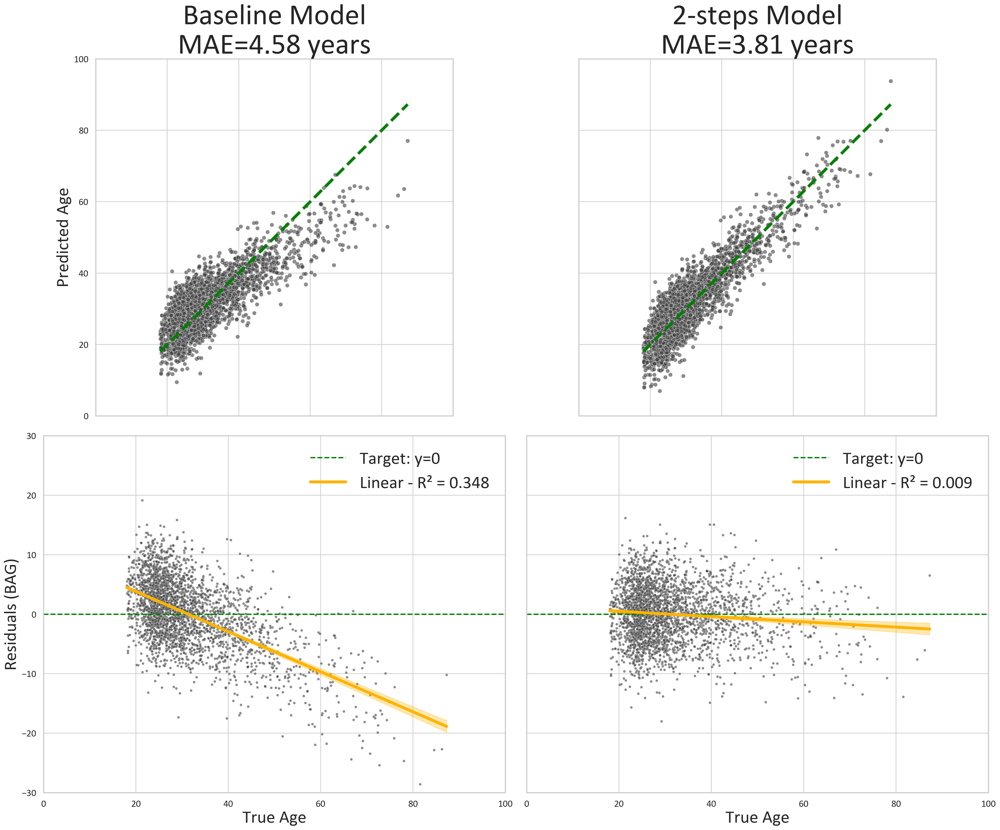

In [25]:
# plot actual vs predicted for all of the models
# plot residuals vs age for all of the models
from statsmodels.formula.api import ols
import statsmodels.api as sm

keys_vis = {
    "baseline": "Baseline Model",
    "weighted": "Census-Weighted Model",
    "linear_ph": "2-steps Model",
    "quadratic_ph": "Quadratic Post-hoc",
    "combined": "Census-Weighted 2-steps Model",
}

title_fontsize = 50
rest_fontsize = 30

nmodels = len(vis_predictions)
fig, axes = plt.subplots(2, nmodels, figsize=(12 * nmodels, 20), sharey=False, sharex=True)
for i, (key, df) in enumerate(vis_predictions.items()):
    ax = axes[0, i]
    sns.scatterplot(data=df, x="True", y="Predicted", ax=ax, s=50, color=COL_REF, alpha=0.6)
    ax.set_title(
        f"{keys_vis[key]}\nMAE={weighting_df.loc[key, val_metric]:.2f} years",
        fontsize=title_fontsize,
    )
    ax.set_aspect("equal")
    ax.set_xlabel("")
    ax.plot(
        [df["True"].min(), df["True"].max()],
        [df["True"].min(), df["True"].max()],
        color="green",
        linestyle="--",
        lw=5,
    )
    ax.set_xlim(0, 100)
    ax.set_ylim(0, 100)
    if i == 0:
        ax.set_ylabel("Predicted Age", fontsize=rest_fontsize)
    else:
        ax.set_ylabel("")
        # remove y-axis tick labels
        ax.set_yticklabels([])


for i, (key, df) in enumerate(vis_predictions.items()):
    ax = axes[1, i]
    if "ph" in key:
        y_col = "corrected_residuals"
    else:
        df["raw_residuals"] = df["Predicted"] - df["True"]
        y_col = "raw_residuals"
    df = df.rename(columns={"True": "age_at_scan"})
    sns.scatterplot(data=df, x="age_at_scan", y=y_col, ax=ax, s=20, color=COL_REF, alpha=0.6)

    # estimate linear and quadratic fit between residuals and age
    lin_m = ols(f"{y_col} ~ age_at_scan", data=df).fit()
    poly_m = ols(f"{y_col} ~ age_at_scan + I(age_at_scan ** 2)", data=df).fit()
    # draw the "target": y = 0 line
    ax.axhline(0, color="green", linestyle="--", label="Target: y=0")
    # plot the linear fit
    x_vals = np.linspace(df["age_at_scan"].min(), df["age_at_scan"].max(), 300)
    x_frame = pd.DataFrame({"age_at_scan": x_vals})
    # find the p-value for the linear fit
    p_value = lin_m.f_pvalue
    # For visualisation, find the p < {something} value
    p_vis = f"{p_value:.2e}" if p_value < 0.001 else f"{p_value:.3f}"
    r, p = pearsonr(df["age_at_scan"], df[y_col])
    # lin_label = f"Linear - R² = {lin_m.rsquared_adj:.3f}, p = {p_vis}"
    lin_label = f"Linear - R² = {lin_m.rsquared_adj:.3f}"
    # lin_label = f"$r$ = {r**2:.3f}, p = {p_vis}"
    # get predictions with CI
    lin_predictions = lin_m.get_prediction(x_frame)
    lin_predictions = lin_predictions.summary_frame(alpha=0.05)
    # plot the linear fit with confidence intervals
    ax.plot(x_vals, lin_m.predict(x_frame), color=COL_RAW, label=lin_label, lw=5)
    ax.fill_between(
        x_vals,
        lin_predictions["mean_ci_lower"],
        lin_predictions["mean_ci_upper"],
        color=COL_RAW,
        alpha=0.3,
    )
    # plot the quadratic fit
    # poly_label = f"Quadratic - R² = {poly_m.rsquared:.2f}, AIC = {poly_m.aic:.1f}"
    # get predictions with CI
    # poly_predictions = poly_m.get_prediction(x_frame)
    # poly_predictions = poly_predictions.summary_frame(alpha=0.05)
    # plot the quadratic fit with confidence intervals
    # ax.plot(
    #     x_vals, poly_m.predict(x_frame), color=COL_WEIGHTED, label=poly_label, lw=3
    # )
    # ax.fill_between(
    #     x_vals,
    #     poly_predictions["mean_ci_lower"],
    #     poly_predictions["mean_ci_upper"],
    #     color=COL_WEIGHTED, alpha=0.3
    # )
    # ax.set_title(f"{keys_vis[key]} Residuals\nMAE={weighting_df.loc[key, 'MAE_weighted']:.2f} years")
    ax.legend(frameon=False, loc="upper right", fontsize=rest_fontsize)

    ax.set_xlabel("True Age", fontsize=rest_fontsize)
    if i == 0:
        ax.set_ylabel("Residuals (BAG)", fontsize=rest_fontsize)
    else:
        ax.set_ylabel("")
        # remove y-axis tick labels
        ax.set_yticklabels([])
    ax.set_ylim(-30, 30)

    # ax.set_xlim(df["age_at_scan"].min(), df["age_at_scan"].max())
    # ax.legend(frameon=False)
plt.tight_layout()
savefig_nice(
    fig,
    OUTPUT_DIR / f"fig3_weighted_predictions_{metric}.png",
    tight=True,
    dpi=300,
)
# savefig_nice(
#     fig,
#     OUTPUT_DIR / "global_efficiency.png",
#     tight=True,
#     dpi=300,
# )

In [26]:
import numpy as np, pandas as pd
from sklearn.linear_model import RidgeCV, ElasticNetCV
from sklearn.model_selection import KFold, cross_val_predict
from sklearn.metrics import r2_score, mean_absolute_error, root_mean_squared_error
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler

alphas = np.logspace(-3, 4, 30)  # ridge λ grid

outer_cv = KFold(
    n_splits=5,
    shuffle=True,
    random_state=1,
)

perf_rows = []

use_weights = False
# do_post_hoc_correction = True
post_hoc_degree = 1
apply_correction = True

predictions = {}

for metric, X in X_dict.items():
    # Optionally concatenate covariates
    covariates = cov_names[metric]
    if cov_names:
        X_model = np.hstack([X, cov[covariates].to_numpy()])
    else:
        X_model = X
    # y_pred = stratified_regression_cv(X_model, y, w, n_splits=10, n_bins=10)
    grid.fit(X_model, y, estimator__sample_weight=w if use_weights else None)
    model = grid.best_estimator_
    # y_pred = model.predict(X_model, **{"y_chron": y} if apply_correction else {})
    y_pred = corrected_cross_val_predict(
        estimator=model,
        X=X_model,
        y=y,
        cv=outer_cv,
        params={"estimator__sample_weight": w if use_weights else None},
        correction_func=beheshti_correction if apply_correction else None,
    )
    # y_pred = manual_cross_val_predict(
    #     model=model,
    #     X=X_model,
    #     y=y,
    #     cv=outer_cv,
    #     sample_weight=w if use_weights else None,
    #     apply_correction=apply_correction,
    # )
    residuals = y_pred - y
    predictions_df = cov.copy()
    predictions_df["True"] = y
    predictions_df["Predicted"] = y_pred
    # predictions_df["raw_residuals"] = original_residuals
    predictions_df["corrected_residuals"] = residuals
    predictions[metric] = predictions_df
    perf_rows.append(
        dict(
            metric=metric,
            model=model,
            # R2=r2_score(y, y_pred, sample_weight=w if use_weights else None),
            # MAE=mean_absolute_error(y, y_pred, sample_weight=w if use_weights else None),
            # RMSE=root_mean_squared_error(y, y_pred, sample_weight=w if use_weights else None),
            R2=r2_score(y, y_pred),
            R2_weighted=r2_score(y, y_pred, sample_weight=w),
            MAE=mean_absolute_error(y, y_pred),
            MAE_weighted=mean_absolute_error(y, y_pred, sample_weight=w),
            RMSE=root_mean_squared_error(y, y_pred),
            RMSE_weighted=root_mean_squared_error(y, y_pred, sample_weight=w),
        )
    )
    # y_pred, original_residuals, corrected_residuals = cross_val_predict_with_bias_correction(
    #     model=model,
    #     X=X_model,
    #     y_chronological=y,
    #     w=w,
    #     cv=outer_cv,
    #     use_weights=use_weights,
    #     post_hoc_degree=post_hoc_degree,
    #     # residual_orthog_degree=post_hoc_degree,
    # )

    # y_pred = cross_val_predict(
    #     model,
    #     X_model,
    #     y,
    #     # groups=age_strata(y),
    #     cv=outer_cv,
    #     params={"estimator__sample_weight": w if use_weights else None},
    #     n_jobs=-1,
    # )
    # if do_post_hoc_correction:
    #     resid = y - y_pred
    #     z = np.polyfit(y, resid, 2)
    #     p = np.poly1d(z)
    #     y_pred = y_pred + p(y)
    # # Save predictions

    # break

Fitting 3 folds for each of 30 candidates, totalling 90 fits
Fitting 3 folds for each of 30 candidates, totalling 90 fits
Fitting 3 folds for each of 30 candidates, totalling 90 fits
Fitting 3 folds for each of 30 candidates, totalling 90 fits
Fitting 3 folds for each of 30 candidates, totalling 90 fits
Fitting 3 folds for each of 30 candidates, totalling 90 fits
Fitting 3 folds for each of 30 candidates, totalling 90 fits


3.7936102158477114
0.7685321606870693


(0.0, 100.0)

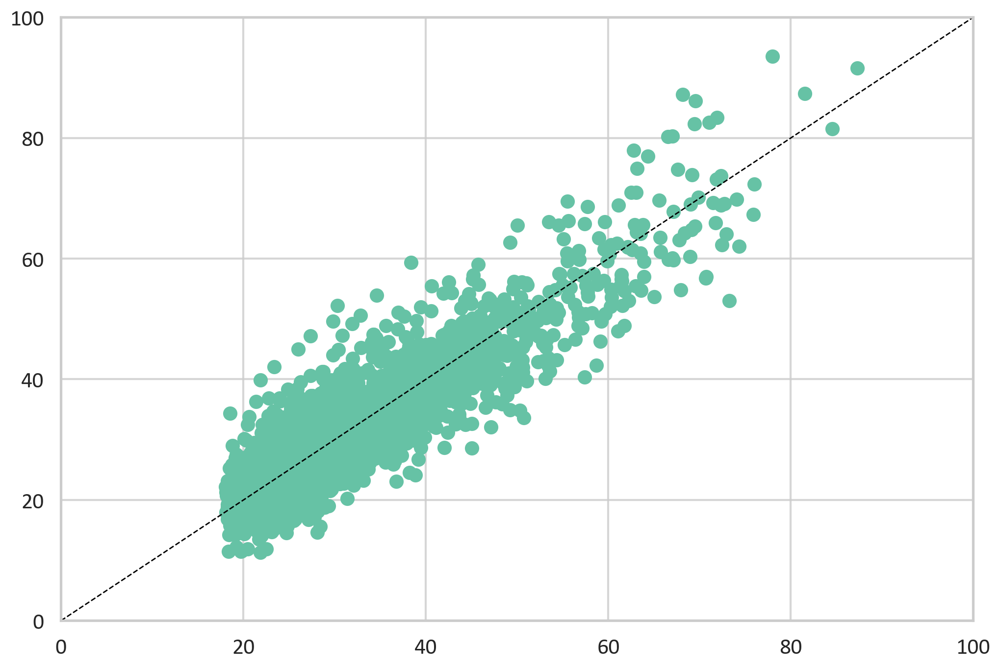

In [27]:
print(mean_absolute_error(y, y_pred, sample_weight=w if use_weights else None))
print(r2_score(y, y_pred, sample_weight=w if use_weights else None))
plt.scatter(y, y_pred)
plt.plot([0, 100], [0, 100], color="black", linestyle="--", linewidth=1)
plt.xlim(0, 100)
plt.ylim(0, 100)

In [28]:
from scipy.stats import spearmanr

spearmanr(predictions["gm_vol"]["True"], predictions["gm_vol"]["corrected_residuals"])

SignificanceResult(statistic=np.float64(-0.04837405140857072), pvalue=np.float64(0.010520374051437593))

In [29]:
pd.DataFrame(perf_rows).set_index("metric").sort_values("MAE", ascending=True)

,model,R2,R2_weighted,MAE,MAE_weighted,RMSE,RMSE_weighted
metric,,,,,,,
ad,"(RobustScaler(), Ridge(alpha=np.float64(621.01...",0.787044,0.892110,3.613889,4.389477,4.763356,5.708738
adc,"(RobustScaler(), Ridge(alpha=np.float64(621.01...",0.786075,0.885090,3.636259,4.524647,4.774183,5.891531
fa,"(RobustScaler(), Ridge(alpha=np.float64(356.22...",0.785223,0.887759,3.691937,4.414890,4.783670,5.822712
csf_vol,"(RobustScaler(), Ridge(alpha=np.float64(356.22...",0.779288,0.878704,3.710099,4.597449,4.849321,6.053027
gm_vol,"(RobustScaler(), Ridge(alpha=np.float64(117.21...",0.788801,0.913418,3.774848,4.087720,4.743659,5.114033
rd,"(RobustScaler(), Ridge(alpha=np.float64(356.22...",0.768532,0.870263,3.793610,4.759437,4.966074,6.260122
wm_vol,"(RobustScaler(), Ridge(alpha=np.float64(204.33...",0.768959,0.902714,3.918588,4.256087,4.961495,5.420941


In [30]:
# ### ----------- Concatenate all metrics into one model ----------- ###
# from sklearn.pipeline import make_pipeline

# X_concat = np.hstack([X_dict[m] for m in metrics])  # already row-aligned
# # add covariates
# covariates = pd.concat([cov[cov_names[m]] for m in metrics], axis=1)
# # drop duplicate columns
# covariates = covariates.loc[:, ~covariates.columns.duplicated()].to_numpy()
# X_concat = np.hstack([X_concat, covariates])

# pipe = Pipeline(
#     [
#         ("scaler", scaler),
#         ("estimator", estimator),
#     ]
# )
# y_pred, original_residuals, corrected_residuals = cross_val_predict_with_bias_correction(
#     model=pipe,
#     X=X_concat,
#     y_chronological=y,
#     w=w,
#     cv=outer_cv,
#     use_weights=use_weights,
#     post_hoc_degree=post_hoc_degree,
#     # residual_orthog_degree=post_hoc_degree,
# )

# # if do_post_hoc_correction:
# #     resid = y - y_pred
# #     z = np.polyfit(y, resid, 2)
# #     p = np.poly1d(z)
# #     y_pred = y_pred + p(y)
# # # Save predictions
# predictions_df = cov.copy()
# predictions_df["True"] = y
# predictions_df["Predicted"] = y_pred
# predictions_df["raw_residuals"] = original_residuals
# predictions_df["corrected_residuals"] = corrected_residuals
# predictions["concatenated"] = predictions_df
# perf_rows.append(
#     dict(
#         metric="concatenated",
#         R2=r2_score(y, y_pred),
#         R2_weighted=r2_score(y, y_pred, sample_weight=w),
#         MAE=mean_absolute_error(y, y_pred),
#         MAE_weighted=mean_absolute_error(y, y_pred, sample_weight=w),
#         RMSE=root_mean_squared_error(y, y_pred),
#         RMSE_weighted=root_mean_squared_error(y, y_pred, sample_weight=w),
#     )
# )

In [31]:
# polynomial features
from sklearn.preprocessing import PolynomialFeatures
from sklearn.ensemble import RandomForestRegressor

# ---------------------------------------------------------------------
# 2. Parcel-wise base-learner loop
# ---------------------------------------------------------------------
stacked_models = parcels.copy()

stacked_estimators = {}
predictions["base_stacked"] = {}

alphas = np.logspace(-3, 4, 30)  # ridge grid
for i, row in parcels.iterrows():  # i == parcel index (0..453)
    # ------------- build design matrix for parcel i -----------------
    # X_roi : (n_subjects , 5 metrics)
    # X_cov = cov[cov_names["gm_vol"]].to_numpy()
    X_roi = np.hstack([X_dict[m][:, [i]] for m in metrics])
    # X_roi = np.hstack([X_roi, X_cov])  # add covariates
    grid.fit(X_roi, y, estimator__sample_weight=w if use_weights else None)  # fit the model
    model = grid.best_estimator_  # get the best model
    y_pred = cross_val_predict(
        estimator=model,
        X=X_roi,
        y=y,
        cv=outer_cv,
        params={"estimator__sample_weight": w if use_weights else None},
        # correction_func=beheshti_correction if apply_correction else None,
    )
    # y_pred = manual_cross_val_predict(
    #     model=pipe,
    #     X=X_roi,
    #     y=y,
    #     cv=outer_cv,
    #     sample_weight=w if use_weights else None,
    #     # apply_correction=apply_correction,
    #     apply_correction=False,
    # )
    # y_pred = pipe.predict(X_roi, **{"y_chron": y} if apply_correction else {})
    residuals = y_pred - y
    # ---------------- fit model & predict --------------------------
    # y_pred, original_residuals, corrected_residuals = cross_val_predict_with_bias_correction(
    #     model=pipe,
    #     X=X_roi,
    #     y_chronological=y,
    #     w=w,
    #     cv=outer_cv,
    #     use_weights=use_weights,
    #     post_hoc_degree=0,
    #     # residual_orthog_degree=post_hoc_degree,
    # )

    # ---------------- store predictions & metrics -------------------
    pred_df = cov.copy()
    pred_df["True"] = y
    pred_df["Predicted"] = y_pred
    # pred_df["raw_residuals"] = original_residuals
    pred_df["corrected_residuals"] = residuals
    predictions["base_stacked"][i] = pred_df
    r2 = r2_score(y, y_pred)
    mae = mean_absolute_error(y, y_pred)
    rmse = root_mean_squared_error(y, y_pred)
    r2_weighted = r2_score(y, y_pred, sample_weight=w)
    mae_weighted = mean_absolute_error(y, y_pred, sample_weight=w)
    rmse_weighted = root_mean_squared_error(y, y_pred, sample_weight=w)

    stacked_models.loc[
        i, ["R2", "MAE", "RMSE", "R2_weighted", "MAE_weighted", "RMSE_weighted"]
    ] = [r2, mae, rmse, r2_weighted, mae_weighted, rmse_weighted]
    stacked_estimators[i] = model
    # if i == 428:
    #     break

Fitting 3 folds for each of 30 candidates, totalling 90 fits
Fitting 3 folds for each of 30 candidates, totalling 90 fits
Fitting 3 folds for each of 30 candidates, totalling 90 fits
Fitting 3 folds for each of 30 candidates, totalling 90 fits
Fitting 3 folds for each of 30 candidates, totalling 90 fits
Fitting 3 folds for each of 30 candidates, totalling 90 fits
Fitting 3 folds for each of 30 candidates, totalling 90 fits
Fitting 3 folds for each of 30 candidates, totalling 90 fits
Fitting 3 folds for each of 30 candidates, totalling 90 fits
Fitting 3 folds for each of 30 candidates, totalling 90 fits
Fitting 3 folds for each of 30 candidates, totalling 90 fits
Fitting 3 folds for each of 30 candidates, totalling 90 fits
Fitting 3 folds for each of 30 candidates, totalling 90 fits
Fitting 3 folds for each of 30 candidates, totalling 90 fits
Fitting 3 folds for each of 30 candidates, totalling 90 fits
Fitting 3 folds for each of 30 candidates, totalling 90 fits
Fitting 3 folds for each

<Axes: >

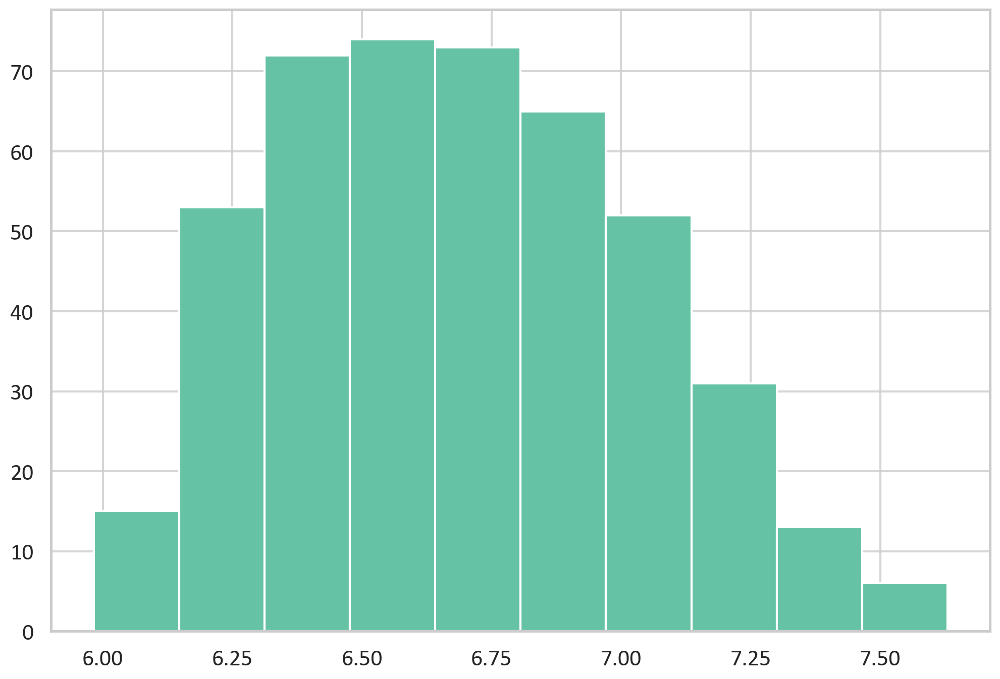

In [32]:
stacked_models["MAE"].hist()
# plt.scatter(y,y_pred)
# stacked_models.sort_values("MAE_weighted", ascending=True)

In [33]:
stacked_models.sort_values("MAE", ascending=True)

,index,name,base_name,Label Name,network,component,hemisphere,R2,MAE,RMSE,R2_weighted,MAE_weighted,RMSE_weighted
331,332,7Networks_RH_Cont_Par_1,7networks_rh_cont_par,7Networks_RH_Cont_Par,control,parietal,R,0.393645,5.982809,8.037689,0.353806,10.705459,13.971128
255,256,7Networks_RH_SomMot_26,7networks_rh_sommot,7Networks_RH_SomMot,somatomotor,somatomotor,R,0.390258,5.989013,8.060109,0.387710,10.534914,13.599681
413,414,PUT-DA-rh,PUT-DA,"Putamen, dorso-anterior part",subcortex,Putamen,R,0.358045,5.994791,8.270278,0.275585,11.262311,14.792580
311,312,7Networks_RH_SalVentAttn_Med_2,7networks_rh_salventattn_med,7Networks_RH_SalVentAttn_Med,salience / ventral attention,medial,R,0.395520,6.035013,8.025254,0.407029,10.450587,13.383409
376,377,7Networks_RH_Default_PFCv_3,7networks_rh_default_pfcv,7Networks_RH_Default_PFCv,default,ventral prefrontal cortex,R,0.370439,6.071304,8.190052,0.315727,10.980200,14.376889
...,...,...,...,...,...,...,...,...,...,...,...,...,...
433,434,HIP-tail-lh,HIP-tail,Hippocampus tail,subcortex,Hippocampus tail,L,0.075451,7.465913,9.925052,-0.124495,14.684489,18.430156
401,402,HIP-head-m2-rh,HIP-head-m2,"Hippocampus head, medial division",subcortex,Hippocampus head,R,0.054507,7.529899,10.036842,-0.199891,15.128044,19.037986
425,426,pGP-rh,pGP,"Pallidum, posterior part",subcortex,Pallidum,R,0.049186,7.540604,10.065041,-0.204261,15.054585,19.072628
432,433,HIP-body-lh,HIP-body,Hippocampus body,subcortex,Hippocampus body,L,0.061641,7.560722,9.998906,-0.152451,14.974395,18.657844


In [34]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import RidgeCV
from sklearn.metrics import (
    r2_score,
    mean_absolute_error,
    mean_squared_error,
)

# ------------------------------------------------------------------
# 1.  Build the meta-feature matrix  (n_subj × n_parcels [+ covariates])
# ------------------------------------------------------------------
# stack parcel OOF columns → shape (454, n_subj) → transpose
X_cov = cov[cov_names["gm_vol"]].to_numpy()
X_stacked = np.vstack(
    [predictions["base_stacked"][i]["Predicted"].to_numpy() for i in predictions["base_stacked"]]
).T  # (n_subj, n_parcels)

# Optionally add covariates (e.g., sex, TIV)
X_stacked = np.hstack([X_stacked, X_cov])  # (n_subj, n_parcels + n_covariates)

# ------------------------------------------------------------------
# 2.  Meta-learner pipeline (standardised ridge with CV on λ)
# ------------------------------------------------------------------
grid.fit(X_stacked, y, estimator__sample_weight=w if use_weights else None)  # fit the model
model = grid.best_estimator_  # get the best model

# y_pred = pipe.predict(X_stacked, **{"y_chron": y} if apply_correction else {})
y_pred = corrected_cross_val_predict(
    estimator=model,
    X=X_stacked,
    y=y,
    cv=outer_cv,
    params={"estimator__sample_weight": w if use_weights else None},
    correction_func=beheshti_correction if apply_correction else None,
)
# y_pred = manual_cross_val_predict(
#     model=pipe,
#     X=X_stacked,
#     y=y,
#     cv=outer_cv,
#     sample_weight=w if use_weights else None,
#     apply_correction=apply_correction,
# )
residuals = y_pred - y
# ------------------------------------------------------------------
# 3.  Out-of-fold meta predictions with fold-wise bias correction
# ------------------------------------------------------------------
# y_pred, original_residuals, corrected_residuals = cross_val_predict_with_bias_correction(
#     model=pipe,
#     X=X_stacked,
#     y_chronological=y,
#     w=w,
#     cv=outer_cv,
#     use_weights=use_weights,
#     post_hoc_degree=post_hoc_degree,
#     # residual_orthog_degree=post_hoc_degree,
# )

# ------------------------------------------------------------------
# 4.  Store predictions and performance
# ------------------------------------------------------------------
pred_df = cov.copy()
pred_df["True"] = y
pred_df["Predicted"] = y_pred
# pred_df["raw_residuals"] = original_residuals
pred_df["corrected_residuals"] = residuals
predictions["stacked"] = pred_df


perf_rows.append(
    dict(
        metric="stacked",
        model=model,
        R2=r2_score(y, y_pred),
        R2_weighted=r2_score(y, y_pred, sample_weight=w),
        MAE=mean_absolute_error(y, y_pred),
        MAE_weighted=mean_absolute_error(y, y_pred, sample_weight=w),
        RMSE=root_mean_squared_error(y, y_pred),
        RMSE_weighted=root_mean_squared_error(y, y_pred, sample_weight=w),
    )
)

Fitting 3 folds for each of 30 candidates, totalling 90 fits


In [35]:
dict(
    metric="stacked",
    R2=r2_score(y, y_pred),
    R2_weighted=r2_score(y, y_pred, sample_weight=w),
    MAE=mean_absolute_error(y, y_pred),
    MAE_weighted=mean_absolute_error(y, y_pred, sample_weight=w),
    RMSE=root_mean_squared_error(y, y_pred),
    RMSE_weighted=root_mean_squared_error(y, y_pred, sample_weight=w),
)

{'metric': 'stacked',
 'R2': 0.8096815317698283,
 'R2_weighted': 0.8992377734142312,
 'MAE': 3.464908061767382,
 'MAE_weighted': 4.222478437990184,
 'RMSE': 4.503066194095558,
 'RMSE_weighted': 5.516950089003828}

In [36]:
m = "MAE"
perf_df = pd.DataFrame(perf_rows).set_index("metric").sort_values(m, ascending=True)

In [37]:
perf_df["is_best"] = perf_df[m] == perf_df[m].min()
# set is_best == False to gray and True to green (use RGB colors)
perf_df["color"] = perf_df["is_best"].map({True: COL_WEIGHTED, False: COL_RAW})

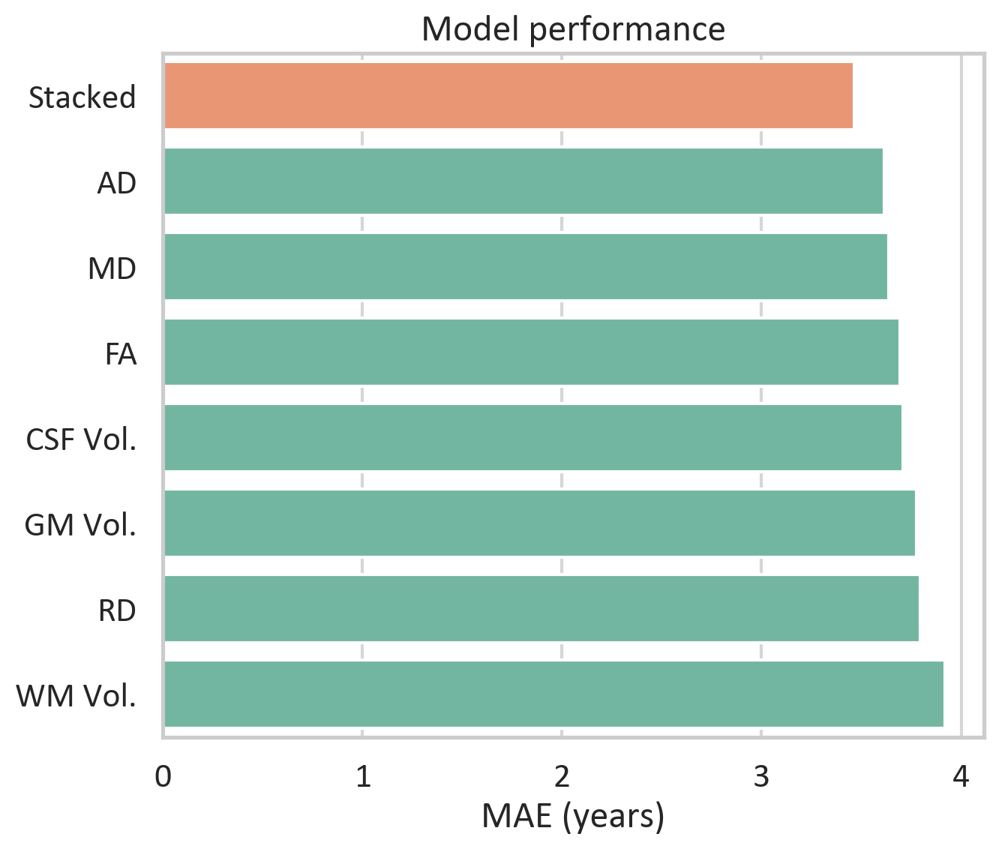

In [38]:
# -----------------------------------------------------------
# 2.  barplot with 95 % BCa bootstrap CIs on R²
# -----------------------------------------------------------
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.utils import resample

ticks_mapping = {
    "gm_vol": "GM Vol.",
    "wm_vol": "WM Vol.",
    "csf_vol": "CSF Vol.",
    "rd": "RD",
    "fa": "FA",
    "ad": "AD",
    "adc": "MD",
    "stacked": "Stacked",
}

fig, ax = plt.subplots(figsize=(7, 6))
sns.barplot(
    y="metric", x=m, data=perf_df.reset_index(), ax=ax, orient="h", hue="is_best", legend=False
)
# ax.errorbar(
#     x=np.arange(len(perf_df)),
#     y=perf_df["RMSE"],
#     # yerr=[perf_df["R2"] - ci_lo, ci_hi - perf_df["R2"]],
#     fmt="none",

#     capsize=4,
#     color="k",
#     lw=1,
# )
# change the y-ticks to the metric names
ax.set_yticks(np.arange(len(perf_df)))
ax.set_yticklabels([ticks_mapping.get(m, m) for m in perf_df.index])
# ax.set_ylabel("$R^{2}$  (10× CV, bias-corrected)")
ax.set_xlabel("MAE (years)")
ax.set_ylabel("")
ax.set_title("Model performance")
# ax.set_xticks(np.arange(0, 1.1, 0.1))
# ax.set_ylim(0.8, perf_df["R2"].max() * 1.15)
plt.tight_layout()
# ax.set_xlim(3,6)
savefig_nice(
    fig,
    OUTPUT_DIR / "model_performance.png",
    tight=True,
    dpi=300,
)
# plt.show()

In [39]:
mpl.rcParams.update(
    {
        # ── Canvas size & resolution ───────────────────────────────────────────
        # Default figure size: 12×8 inches  →  4800×3200 px when exported at 400 dpi
        "figure.figsize": (12, 8),
        "figure.dpi": 200,  # crisp in-notebook / retina preview
        "savefig.dpi": 400,  # print-quality PNG/PDF
        # ── Fonts ──────────────────────────────────────────────────────────────
        "font.family": "calibri",
        "font.sans-serif": ["Roboto", "DejaVu Sans", "Arial"],
        "axes.titlesize": 24,
        # "axes.titleweight": "bold",
        "axes.labelsize": 24,
        "xtick.labelsize": 14,
        "ytick.labelsize": 14,
        "legend.fontsize": 20,
        # ── Axis & spine aesthetics ────────────────────────────────────────────
        "axes.spines.top": False,
        "axes.spines.right": False,
        "axes.spines.left": True,
        "axes.spines.bottom": True,
        "axes.linewidth": 1,
        "axes.grid": True,
        "grid.color": "#E6E6E6",
        "grid.linewidth": 0.4,
        "grid.alpha": 0.8,
        # ── Colour cycle (colour-blind-safe) ───────────────────────────────────
        "axes.prop_cycle": mpl.cycler(color=sns.color_palette("Set2")),
        # ── Figure background ─────────────────────────────────────────────────
        "figure.facecolor": "white",
    }
)

# Seaborn theme inherits the rcParams above
sns.set_theme(context="talk", style="whitegrid", palette="Set2")


# 2.  Seaborn theme (inherits Matplotlib rcParams)
sns.set_theme(
    context="talk",  # slightly larger fonts for presentations / papers
    style="whitegrid",  # grid only on y-axis (good for histograms)
    palette="Set2",  # matches the rcParams colour cycle
)

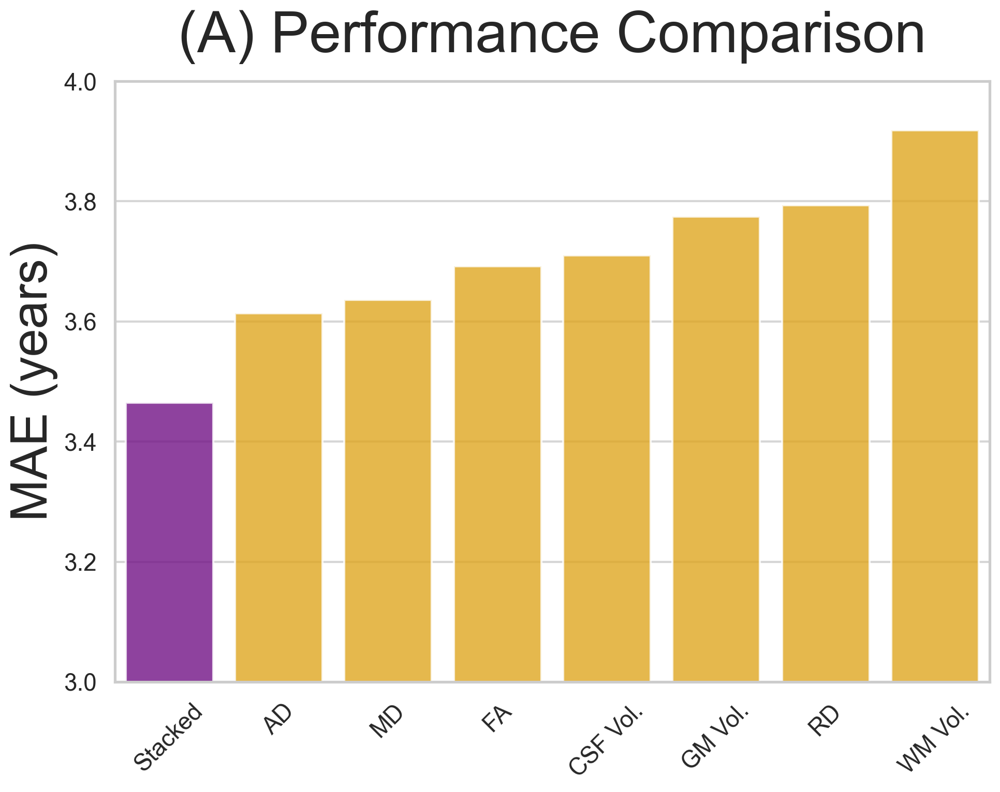

In [40]:
# -----------------------------------------------------------
# 2.  barplot with 95 % BCa bootstrap CIs on R²
# -----------------------------------------------------------
import matplotlib.pyplot as plt
import seaborn as sns

ticks_mapping = {
    "gm_vol": "GM Vol.",
    "wm_vol": "WM Vol.",
    "csf_vol": "CSF Vol.",
    "rd": "RD",
    "fa": "FA",
    "ad": "AD",
    "adc": "MD",
    "stacked": "Stacked",
}

fig, ax = plt.subplots(figsize=(10, 8))
mpl.rcParams.update({"axes.labelsize": 35, "ytick.labelsize": 25, "xtick.labelsize": 25})

sns.barplot(
    x="metric",
    y=m,
    data=perf_df.reset_index(),
    ax=ax,
    orient="v",
    hue="is_best",
    legend=False,
    alpha=0.8,
    palette=[COL_RAW, COL_WEIGHTED],
)
# ax.errorbar(
#     x=np.arange(len(perf_df)),
#     y=perf_df["RMSE"],
#     # yerr=[perf_df["R2"] - ci_lo, ci_hi - perf_df["R2"]],
#     fmt="none",

#     capsize=4,
#     color="k",
#     lw=1,
# )
# change the y-ticks to the metric names
ax.set_xticks(np.arange(len(perf_df)))
# rotate x-tick labels for better visibility
ax.set_xticklabels([ticks_mapping.get(m, m) for m in perf_df.index], rotation=45)
# ax.set_ylabel("$R^{2}$  (10× CV, bias-corrected)")
ax.set_ylabel("MAE (years)", fontsize=35)
ax.set_xlabel("")
ax.set_title("(A) Performance Comparison", fontsize=40, pad=20)
ax.set_ylim(3, 4)


# ax.set_xticks(np.arange(0, 1.1, 0.1))
# ax.set_ylim(0.8, perf_df["R2"].max() * 1.15)
plt.tight_layout()
# ax.set_xlim(3,6)
savefig_nice(
    fig,
    OUTPUT_DIR / "model_performance_h.png",
    tight=True,
    dpi=300,
)
# # plt.show()

In [41]:
OUTPUT_DIR

PosixPath('/media/storage/phd/neuroaging/figures/revision/fig4')

In [42]:
best_metric = perf_df.index[0]
# best_metric = "stacked"
y = predictions[best_metric]["True"].to_numpy()
y_pred = predictions[best_metric]["Predicted"].to_numpy()
# w = predictions[best_metric]["weight"].to_numpy()
df_vis = (
    predictions[best_metric][["True", "Predicted"]]
    .copy()
    .rename(columns={"True": "age", "Predicted": "predicted"})
)

df_vis["residuals"] = df_vis["predicted"] - df_vis["age"]
# # build a model to predict the residuals
# import statsmodels.api as sm
# from statsmodels.formula.api import ols
# import statsmodels.formula.api as smf

# # Fit a linear model to the residuals
# df["residuals"] = residuals
# model = ols("residuals ~ age", data=df).fit()
# # use the model to "fix" the predictions
# df["fixed_predicted"] = df["predicted"] + model.resid

/tmp/ipykernel_1050732/1041710208.py:23: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(
/tmp/ipykernel_1050732/1041710208.py:56: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(


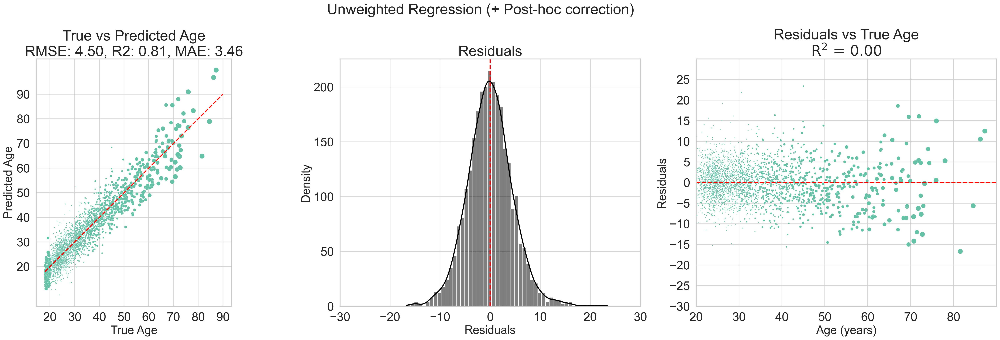

In [43]:
import seaborn as sns
from scipy.stats import pearsonr, spearmanr

# plt.style.use("bmh")

do_post_hoc_correction = True
use_weights = False

r2 = r2_score(y, y_pred, sample_weight=w if use_weights else None)
rmse = root_mean_squared_error(y, y_pred, sample_weight=w if use_weights else None)
mae = mean_absolute_error(y, y_pred, sample_weight=w if use_weights else None)

# r2 = r2_score(y, y_pred)
# rmse = root_mean_squared_error(y, y_pred)
# mae = mean_absolute_error(y, y_pred)


title = f"True vs Predicted Age\nRMSE: {rmse:.2f}, R2: {r2:.2f}, MAE: {mae:.2f}"

fig, axes = plt.subplots(1, 3, figsize=(30, 10))
# plot true vs predicted
ax = axes[0]
sns.scatterplot(
    data=df_vis,
    x="age",
    y="predicted",
    ax=ax,
    # cmap="jet",
    # color by weight,
    # hue=w.flatten(),
    palette="viridis",
    s=w * 10,
)
ax.plot([18, 90], [18, 90], "--", c="red")
ax.set_xlabel("True Age", fontsize=24)
ax.set_ylabel("Predicted Age", fontsize=24)
ax.set_title(title, fontsize=30)
ax.set_xticks(range(20, 100, 10))
ax.set_yticks(range(20, 100, 10))
# make axis square
ax.set_aspect("equal", "box")

# plot residuals
ax = axes[1]
sns.histplot(data=df_vis, x="residuals", ax=ax, kde=True, color="black")
ax.set_xlabel("Residuals", fontsize=24)
ax.set_ylabel("Density", fontsize=24)
ax.set_title("Residuals", fontsize=30)
ax.axvline(0, color="red", linestyle="--")
ax.set_xlim(-30, 30)
# plot residuals vs true age

r, p = pearsonr(df_vis["age"], df_vis["residuals"])

ax = axes[2]
sns.scatterplot(
    data=df_vis,
    x="age",
    y="residuals",
    ax=ax,
    # cmap="jet",
    # color by weight,
    # hue=w.flatten(),
    palette="viridis",
    s=w * 10,
)
ax.axhline(0, color="red", linestyle="--")
ax.set_xlabel("Age (years)", fontsize=24)
ax.set_ylabel("Residuals", fontsize=24)
ax.set_title("Residuals vs True Age\n$R^2$ = {:.2f}".format(r**2), fontsize=30)
ax.set_xticks(range(20, 90, 10))
ax.set_yticks(range(-30, 30, 5))
ax.set_xlim(20, 90)
ax.set_ylim(-30, 30)
# make axis square

suptitle = "Weighted Regression" if use_weights else "Unweighted Regression"
if do_post_hoc_correction:
    suptitle += " (+ Post-hoc correction)"
fig.suptitle(suptitle, fontsize=30)

plt.tight_layout()

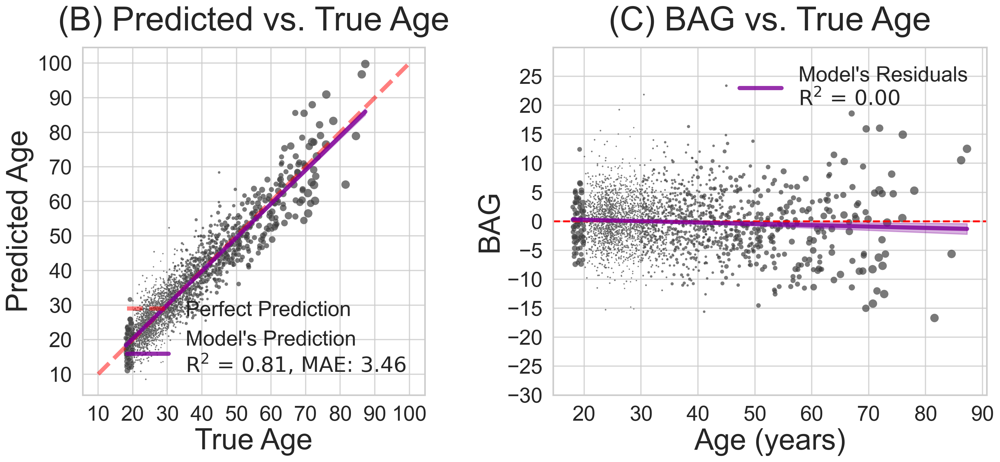

In [44]:
import seaborn as sns
from scipy.stats import pearsonr, spearmanr

# plt.style.use("bmh")

do_post_hoc_correction = True
use_weights = False

r2 = r2_score(y, y_pred, sample_weight=w if use_weights else None)
rmse = root_mean_squared_error(y, y_pred, sample_weight=w if use_weights else None)
mae = mean_absolute_error(y, y_pred, sample_weight=w if use_weights else None)

# r2 = r2_score(y, y_pred)
# rmse = root_mean_squared_error(y, y_pred)
# mae = mean_absolute_error(y, y_pred)


# title = f"True vs Predicted Age\nRMSE: {rmse:.2f}, R2: {r2:.2f}, MAE: {mae:.2f}"
title = "(B) Predicted vs. True Age"

fig, axes = plt.subplots(1, 2, figsize=(20, 8), width_ratios=[2, 1])
# make the left ax larger

mpl.rcParams.update({"axes.labelsize": 35, "ytick.labelsize": 25, "xtick.labelsize": 25})

# plot true vs predicted
ax = axes[0]
sns.scatterplot(
    data=df_vis,
    x="age",
    y="predicted",
    ax=ax,
    # cmap="jet",
    # color by weight,
    # hue=w.flatten(),
    color=COL_REF,
    alpha=0.7,
    s=w * 10,
)
ax.plot([10, 100], [10, 100], "--", c="red", lw=5, alpha=0.5, label="Perfect Prediction")
ax.set_xlabel("True Age")
ax.set_ylabel("Predicted Age")
ax.set_title(title, fontsize=40, pad=20)
ax.set_xticks(range(10, 110, 10))
ax.set_yticks(range(10, 110, 10))
# make axis square
ax.set_aspect("equal", "box")

# add regression line between true and predicted age

lin_m = sm.OLS(df_vis["predicted"], sm.add_constant(df_vis["age"])).fit()
x_vals = np.linspace(df_vis["age"].min(), df_vis["age"].max(), 300)[:, np.newaxis]
y_vals = lin_m.predict(sm.add_constant(x_vals))
ax.plot(
    x_vals,
    y_vals,
    lw=5,
    label=f"Model's Prediction\n$R^2$ = {r2:.2f}, MAE: {mae:.2f}",
    color=COL_WEIGHTED,
)

# add confidence intervals to the regression line
predictions = lin_m.get_prediction(sm.add_constant(x_vals))
predictions = predictions.summary_frame(alpha=0.05)
ax.fill_between(
    x_vals.flatten(),
    predictions["mean_ci_lower"],
    predictions["mean_ci_upper"],
    color=COL_WEIGHTED,
    alpha=0.3,
    # label="95% CI",
)

ax.legend(frameon=False, loc="lower right", fontsize=25)
# plot residuals vs true age


ax = axes[1]
sns.scatterplot(
    data=df_vis,
    x="age",
    y="residuals",
    ax=ax,
    # cmap="jet",
    # color by weight,
    # hue=w.flatten(),
    color=COL_REF,
    alpha=0.7,
    s=w * 10,
)
ax.axhline(0, color="red", linestyle="--")
ax.set_xlabel("Age (years)")
ax.set_ylabel("BAG")
ax.set_title("(C) BAG vs. True Age", fontsize=40, pad=20)
ax.set_xticks(range(20, 100, 10))
ax.set_yticks(range(-30, 30, 5))
ax.set_ylim(-30, 30)
# make axis square

# add regression line between residuals and true age
lin_m = sm.OLS(df_vis["residuals"], sm.add_constant(df_vis["age"])).fit()
x_vals = np.linspace(df_vis["age"].min(), df_vis["age"].max(), 300)[:, np.newaxis]
y_vals = lin_m.predict(sm.add_constant(x_vals))
ax.plot(
    x_vals,
    y_vals,
    lw=5,
    label=f"Model's Residuals\n$R^2$ = {lin_m.rsquared:.2f}",
    color=COL_WEIGHTED,
)
# add confidence intervals to the regression line
predictions = lin_m.get_prediction(sm.add_constant(x_vals))
predictions = predictions.summary_frame(alpha=0.05)
ax.fill_between(
    x_vals.flatten(),
    predictions["mean_ci_lower"],
    predictions["mean_ci_upper"],
    color=COL_WEIGHTED,
    alpha=0.3,
    # label="95% CI",
)
ax.legend(frameon=False, loc="upper right", fontsize=25)

fig.subplots_adjust(wspace=0.01)

plt.tight_layout()
savefig_nice(
    fig,
    OUTPUT_DIR / "true_vs_predicted_age.png",
    tight=True,
    dpi=300,
)

In [45]:
# import shap

# feature importance for the best model
best_model = perf_df.loc[best_metric, "model"]
# best_model = model
# X_inspect = best_model.named_steps["scaler"].transform(X_stacked)

# Use the trained estimator
# explainer = shap.LinearExplainer(best_model.named_steps["estimator"], X_inspect)

# Explain on scaled test data
# shap_values = explainer.shap_values(X_inspect)

In [46]:
import shap

# 1. Transform your data using the scaler part of the pipeline
X_transformed = best_model[:-1].transform(X_stacked)

# 2. Initialize the LinearExplainer with the fitted Ridge model
# We use the transformed data as the background 
model = best_model.named_steps['estimator']
explainer = shap.LinearExplainer(model, X_transformed)

# 3. Calculate SHAP values
shap_values = explainer(X_transformed)

/home/galkepler/Projects/neuroaging/venv/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [47]:
from sklearn.inspection import permutation_importance


# Calculate permutation importance
result = permutation_importance(
    estimator=best_model,
    X=X_stacked,
    y=y,
    scoring="neg_mean_squared_error",
    n_repeats=100,
    random_state=42,
)

In [48]:
# shap.summary_plot(shap_values, X_inspect)
shap_imp = parcels.copy()
shap_imp["importance"] = np.abs(shap_values.values).mean(axis=0)[: len(parcels)]
# shap_imp["importance_abs"] = np.abs(shap_imp["importance"])
shap_imp["importance_shap_scaled"] = (
    shap_imp["importance"] - shap_imp["importance"].min()
) / (shap_imp["importance"].max() - shap_imp["importance"].min())
shap_imp["permutation_importance"] = result.importances_mean[: len(parcels)]
shap_imp["permutation_importance_std"] = result.importances_std[: len(parcels)]
shap_imp[shap_imp["permutation_importance"] < 0] = 0  # set negative importances to 0
# min-max scale the permutation importance
shap_imp["permutation_importance_scaled"] = (
    shap_imp["permutation_importance"] - shap_imp["permutation_importance"].min()
) / (shap_imp["permutation_importance"].max() - shap_imp["permutation_importance"].min())

shap_imp.sort_values("permutation_importance_scaled", ascending=False)

,index,name,base_name,Label Name,network,component,hemisphere,importance,importance_shap_scaled,permutation_importance,permutation_importance_std,permutation_importance_scaled
441,442,PUT-VP-lh,PUT-VP,"Putamen, ventro-posterior part",subcortex,Putamen,L,0.613591,1.000000,1.603976,0.154633,1.000000
437,438,THA-DAm-lh,THA-DAm,"Thalamus, medial dorso-anterior part",subcortex,Thalamus,L,0.444616,0.724483,0.955038,0.111843,0.595419
438,439,THA-DAl-lh,THA-DAl,"Thalamus, lateral dorso-anterior part",subcortex,Thalamus,L,0.458301,0.746797,0.950695,0.103365,0.592711
413,414,PUT-DA-rh,PUT-DA,"Putamen, dorso-anterior part",subcortex,Putamen,R,0.444022,0.723514,0.839835,0.098371,0.523596
411,412,THA-DAl-rh,THA-DAl,"Thalamus, lateral dorso-anterior part",subcortex,Thalamus,R,0.398976,0.650067,0.735005,0.093141,0.458239
...,...,...,...,...,...,...,...,...,...,...,...,...
330,0,0,0,0,0,0,0,0.000000,0.000000,0.000000,0.000000,0.000000
154,0,0,0,0,0,0,0,0.000000,0.000000,0.000000,0.000000,0.000000
164,0,0,0,0,0,0,0,0.000000,0.000000,0.000000,0.000000,0.000000
47,0,0,0,0,0,0,0,0.000000,0.000000,0.000000,0.000000,0.000000


<Axes: >

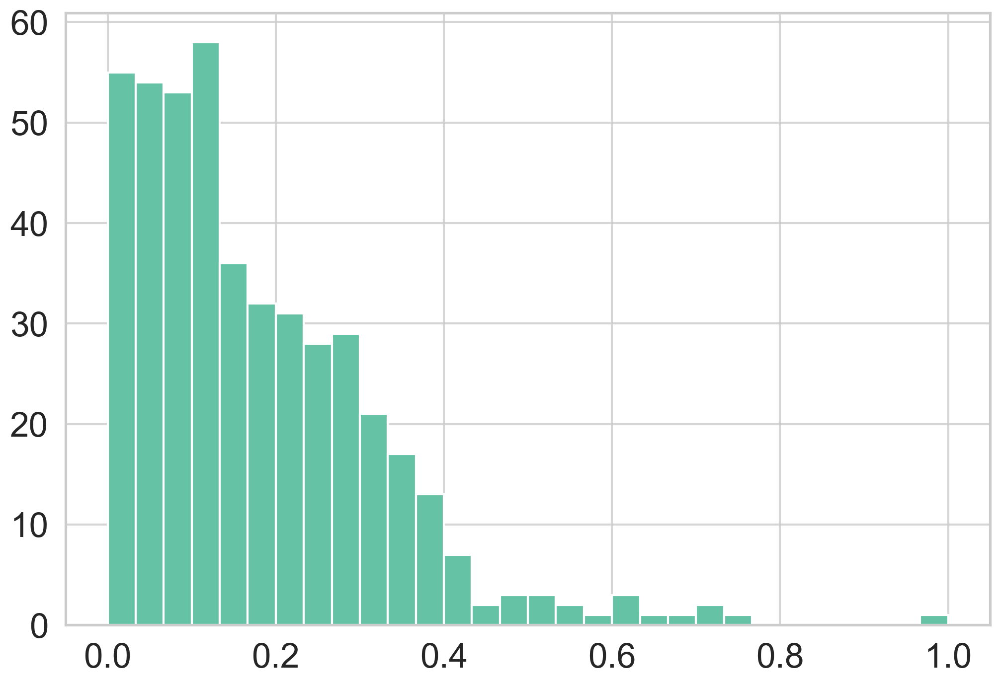

In [49]:
shap_imp["importance_shap_scaled"].hist(bins=30)

In [50]:
shap_imp["importance"].quantile([0.25, 0.5, 0.75, 0.9, 0.95, 0.99])

0.25    0.042769
0.50    0.086342
0.75    0.156773
0.90    0.219051
0.95    0.261041
0.99    0.407668
Name: importance, dtype: float64

In [51]:
import numpy as np
import pandas as pd
import nibabel as nb
from nilearn import surface, datasets
from surfplot import Plot
from matplotlib.colors import TwoSlopeNorm  # nice diverging colours
from neuromaps.datasets import fetch_fslr
from brainspace.datasets import load_parcellation
import nibabel as nib


atlas_img = nib.load(nifti_matlab)

# ---------------------------------------------------------------------
# 2.  FETCH A STANDARD SURFACE  (fsaverage5 = 10k vertices per hemi)
# ---------------------------------------------------------------------
surfaces = fetch_fslr()
lh, rh = surfaces["inflated"]


# ---------------------------------------------------------------------
# 3.  SAMPLE ATLAS VOXELS → SURFACE  (nearest-neighbour so labels stay int)
# ---------------------------------------------------------------------
# add schaefer parcellation (no color bar needed)
lh_parc, rh_parc = load_parcellation("schaefer")

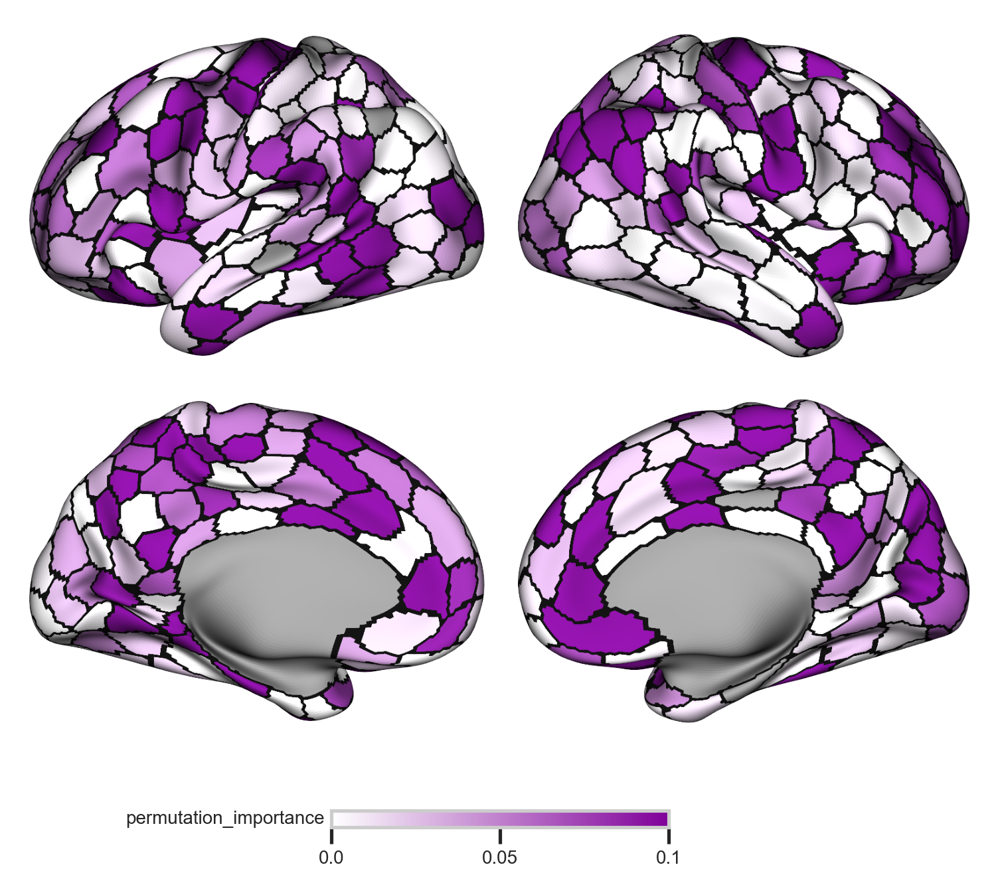

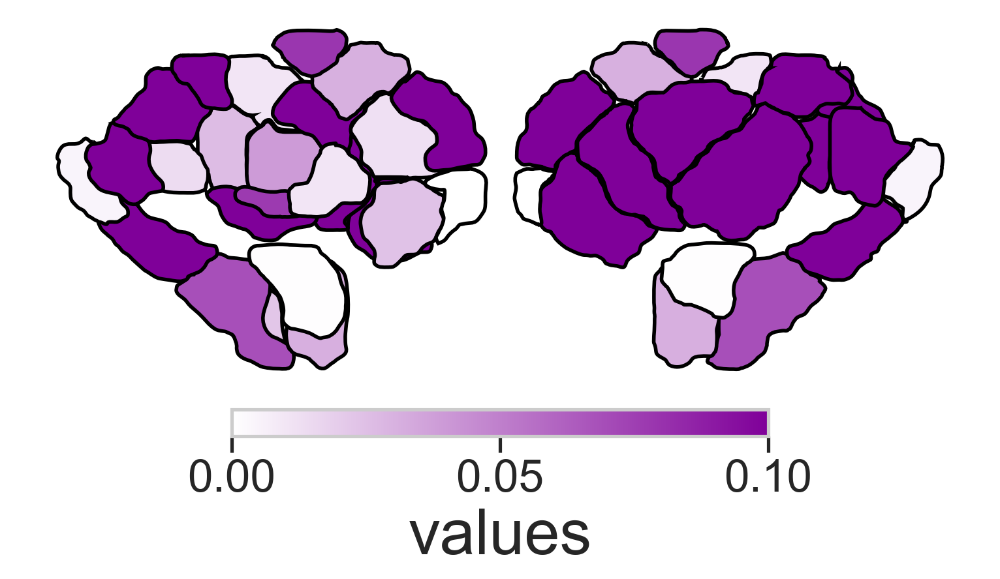

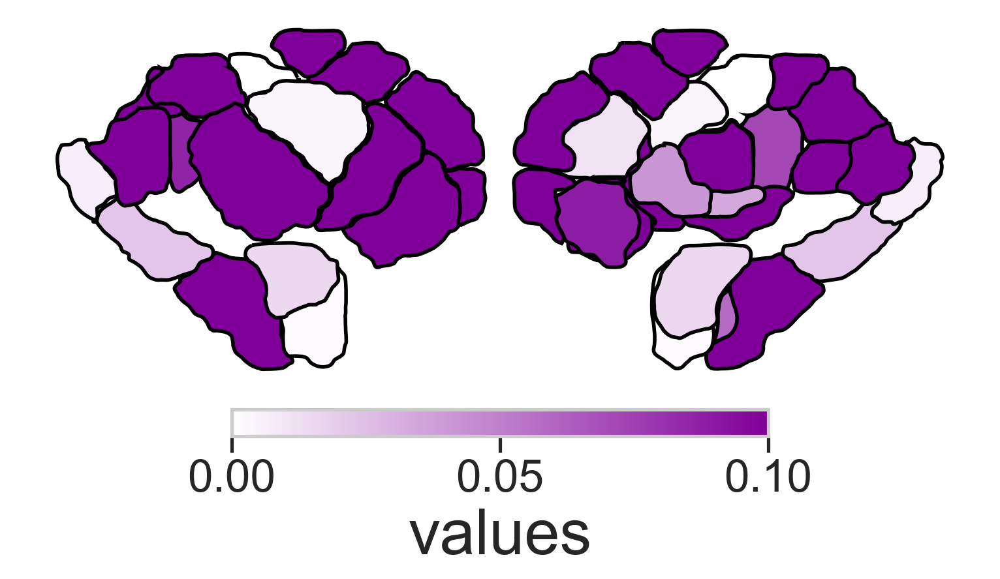

In [52]:
from subcortex_visualization.plotting import plot_subcortical_data

# ---------------------------------------------------------------------
# 4.  MAP REGION IDs → METRIC VALUES
#     vertices with label 0 (background) → NaN so they render transparent
# ---------------------------------------------------------------------
p_threshold = 0.05
# value_threshold = shap_imp["permutation_importance"].quantile(0.8)  # 95th percentile of absolute importance

value_threshold = 0

value_map = {}
value_map_subcortex = {"region": [], "value": [], "Hemisphere": []}

# vmax = shap_imp["permutation_importance"].quantile(0.95)  # 95th percentile of absolute importance
vmin = 0
vmax = 0.1  # 95th percentile of absolute importance
value_column = "permutation_importance"

# vmin = 0
# vmax = 0.5 # 95th percentile of absolute importance
# value_column = "importance_shap_scaled"
cmap = CMAP_WEIGHTED  # cmap for visualization

vis_df = shap_imp.copy()  # Use the stacked_models DataFrame

# vis_df = stats.copy()
# p_column = "p_val"

value_map_lh = {}  # New: separate map for left hemisphere
value_map_rh = {}  # New: separate map for right hemisphere

for i, row in vis_df.iterrows():
    label = row[region_col]
    hemi_row = row["hemisphere"]  # Get hemisphere from your DataFrame row

    # Apply thresholds
    if np.abs(row[value_column]) >= value_threshold:
        value = row[value_column]
    else:
        value = np.nan  # Set to NaN if not significant or below value_threshold

    # Populate the correct hemisphere's value_map
    # Assuming your labels are global and you use the 'hemisphere' column to distinguish
    # If your Schaefer labels are already separated by hemi (e.g., 1-200 for LH, 201-400 for RH)
    # then you might only need to check the label range and not the 'hemisphere' column.
    # For Schaefer, the labels usually run 1-N for LH and N+1 - 2N for RH
    if "schaefer" in ATLAS:
        if label > int(ATLAS.split("_")[1]):
            value_map_subcortex["region"].append(label)
            value_map_subcortex["value"].append(value)
            value_map_subcortex["Hemisphere"].append(row["hemisphere"])
        else:
            if hemi_row == "L":
                value_map_lh[label] = value
            elif hemi_row == "R":
                value_map_rh[label] = value
        # Subcortex handling would go here if you were preparing for separate subcortical visualization
        # else: # This implies it's subcortical or other non-surface region
        #     value_map_subcortex["region"].append(label)
        #     value_map_subcortex["value"].append(value)
        #     value_map_subcortex["Hemisphere"].append(row["hemisphere"])

# Vectorize mapping for left and right hemispheres separately
vec_lh = np.vectorize(lambda x: value_map_lh.get(x, np.nan))
data_lh_mapped = vec_lh(lh_parc)  # Apply LH map to LH parcellation
vec_rh = np.vectorize(lambda x: value_map_rh.get(x, np.nan))
data_rh_mapped = vec_rh(rh_parc)  # Apply RH map to RH parcellation


p = Plot(
    lh,
    rh,
    # Unpack the surface dictionary
    # views=["medial", "lateral"],  # Show both medial and lateral for this hemi
    size=(800, 600),  # px; change as needed
    zoom=1.6,
    layout="grid",  # Horizontal layout for side-by-side views
    mirror_views=True,  # Set to False, as we are plotting one hemi at a time
)

# ---- main data layer -------------------------------------------------
# Pass only the data for the current hemisphere
# The dictionary now contains only one key-value pair for the current hemisphere
p.add_layer(
    {"left": data_lh_mapped, "right": data_rh_mapped},
    cmap=cmap,
    # cmap="coolwarm",
    #     # cmap="coolwarm",
    color_range=(vmin, vmax),  # Use symmetric range
    #     # norm=norm,  # Apply the symmetric normalization
    cbar_label=value_column,
    cbar=True,  # Ensure colorbar is shown for each plot if desired, or handle globally
)
# # ---- outline layer ---------------------------------------------------
p.add_layer({"left": lh_parc, "right": rh_parc}, cmap="gray", as_outline=True, cbar=False)

fig = p.build(
    # cbar_kws=dict(location="bottom", decimals=2, shrink=0.6)
)  # Added cbar_kws for better cbar display
# save figure
savefig_nice(
    fig,
    OUTPUT_DIR / "feature_importance.png",
    tight=True,
    dpi=400,
)


subcort_df = pd.DataFrame(value_map_subcortex)
if "schaefer" in ATLAS:
    subcort_df["region"] = subcort_df["region"] - int(ATLAS.split("_")[1])


for hemi in ["L", "R"]:

    fig = plot_subcortical_data(
        subcort_df,
        atlas="Melbourne_S3",
        show_legend=True,
        hemisphere=hemi,
        cmap=cmap,
        line_color="black",
        line_thickness=2,
        vmin=vmin,
        vmax=vmax,
        show_figure=False,
    )

    # save figure
    savefig_nice(
        fig,
        OUTPUT_DIR / f"feature_importance_subcort_{hemi}.png",
        tight=True,
        dpi=400,
    )
    # savefig_nice(fig, OUTPUT_DIR / f"fig2_subcort_{metric}_{hemi}_{value_column}.png", dpi=400)

In [53]:
predictions_df = pd.DataFrame()
for metric in predictions:
    if "base_stacked" in metric:
        for i, row in parcels.iterrows():
            cur_df = predictions[metric][i][["True", "Predicted"]].copy()
            cur_df = cur_df.rename(
                columns={"True": f"base_{i}_age", "Predicted": f"base_{i}_predicted"}
            )
            cur_df[f"base_{i}_BAG"] = cur_df[f"base_{i}_predicted"] - cur_df[f"base_{i}_age"]
            predictions_df = pd.concat([predictions_df, cur_df], axis=1)
        continue
    cur_df = (
        predictions[metric][["True", "Predicted"]]
        .copy()
        .rename(columns={"True": f"{metric}_age", "Predicted": f"{metric}_predicted"})
    )
    cur_df[f"{metric}_BAG"] = cur_df[f"{metric}_predicted"] - cur_df[f"{metric}_age"]
    predictions_df = pd.concat([predictions_df, cur_df], axis=1)


# w = predictions[best_metric]["weight"].to_numpy()


# # build a model to predict the residuals
# import statsmodels.api as sm
# from statsmodels.formula.api import ols
# import statsmodels.formula.api as smf

# # Fit a linear model to the residuals
# df["residuals"] = residuals
# model = ols("residuals ~ age", data=df).fit()
# # use the model to "fix" the predictions
# df["fixed_predicted"] = df["predicted"] + model.resi

KeyError: "None of [Index(['True', 'Predicted'], dtype='object')] are in the [index]"

In [ ]:
predictions_df.to_csv("BAG_data_v2.csv")